#**Brian Hankins**
GEOL 557 \
Solo Project 

#**Mineralogy Modeling From XRF Through Multivariate Regression**


#**Abstract**

There are several approaches to modeling mineralogy from elemental data, each with their own strengths and weaknesses. In this workbook, we will walk through a workflow using multivariate regression to predict mineralogy using a training dataset. The objective will be to see how different percentages of the training dataset performs. When using the entire dataset, the apprach works really well, but when the training set is a smaller fraction of the total dataset, the correlation quality diminishes. 

#**Introduction**

Mineralogy is an important attribute when evaluating a formation. It can be measured semi-quantitatively through X-Ray Diffraction (XRD) analysis. However, XRD is expensive, slow, and destructive to the sample material. X-Ray Fluorescence (XRF) analysis measures the elemental composition in a rock. XRF tends to be much cheaper and is relatively quick compared to XRD analysis. It can also be non-destructive if using a hand-held XRF on a core. However, elements by themselves are less intuitive for lithological evaluation and therefore it is common to try and model mineralogy with elemental data.

One approach for modeling mineralogy from elemental data is to simply assume all silica is associated with quartz, all potassium is associated with clay, and all calcium is associated with calcite. A stoichiometric multiplier is then applied and a simple 3 mineral model is generated. This approach, while quick and easy, is not very accurate, assumes only the illite clay fraction is present, and misses out on other key minerals such as pyrite, dolomite, feldspars, and other clay fractions. A second approach is performing a stepwise stoichiometric parceling logic model where elements are consumed based on a set mineral order where less common elements are the limiting factor. This approach requires a specific order in which minerals are calculated that limits the amount of residual elements that are left over. This method struggles when felspars and multiple clay types are present. It can also over predict certain minerals when mixed affinity elements are used as the limiting factor element.

An approach I’ve been interested in trying is a multivariate regression model. Multivariate regression is a method used to measure the degree at which multiple independent variables (predictors) and multiple dependent variables (responses) are linearly related. In this test, elemental data will represent the predictors and mineralogical data will represent the responses. This approach does require some XRD data, but the intent would be to limit the amount of XRD analysis that would be required in order to predict mineralogy from XRF.

The following workbook walks through importing XRF and XRD data from the Dingo well, a scrubbed data set of 286 rotary side wall cores taken from a well in the Delaware Basin. l will evaluate the elemental relationships, perform cluster analysis, and build a multivariate regression (MVR) model. The first MVR pass will be performed on all the samples, and then the model will be ran after the data is randomly subdivided multiple times into training and testing sub-datasets.



#**Methods**

XRF and XRD analysis was performed on 286 rotary side wall core samples from the Delaware Basin Dingo well. A Spectro XEPOS HE bench-top energy dispersive XRF instrument was used for the elemental analysis and the following elements were reported: SiO2, TiO2, Al2O3, Fe2O3, MnO, MgO, CaO, Na2O, K2O, P2O5, SO3, Cl, V, Cr, Co, Ni, Cu, Zn, Ga, As, Br, Rb, Sr, Y, Zr, NB, Mo, Ba, Hf, Pb, Th and U. A Bruker D4 Endeavor XRD instrument was used for the mineralogical analysis and the following minerals were reported: Quartz, K-Feldspar, Plagioclase, Calcite, Dolomite, Siderite, Magnesite, Chlorite, Kaolinite, Illite/Mica, Illite/Smectite, Pyrite and Apatite. It is important to keep in mind that while both analytical techniques measure the rock’s composition, the XRF data is reported as an absolute measurements and the XRD data is reported normalized to 100%. This can cause some error if any significant non-crystalline minerals exist, such as opal. Opal in high quantities is not expected so this might be a moot point.


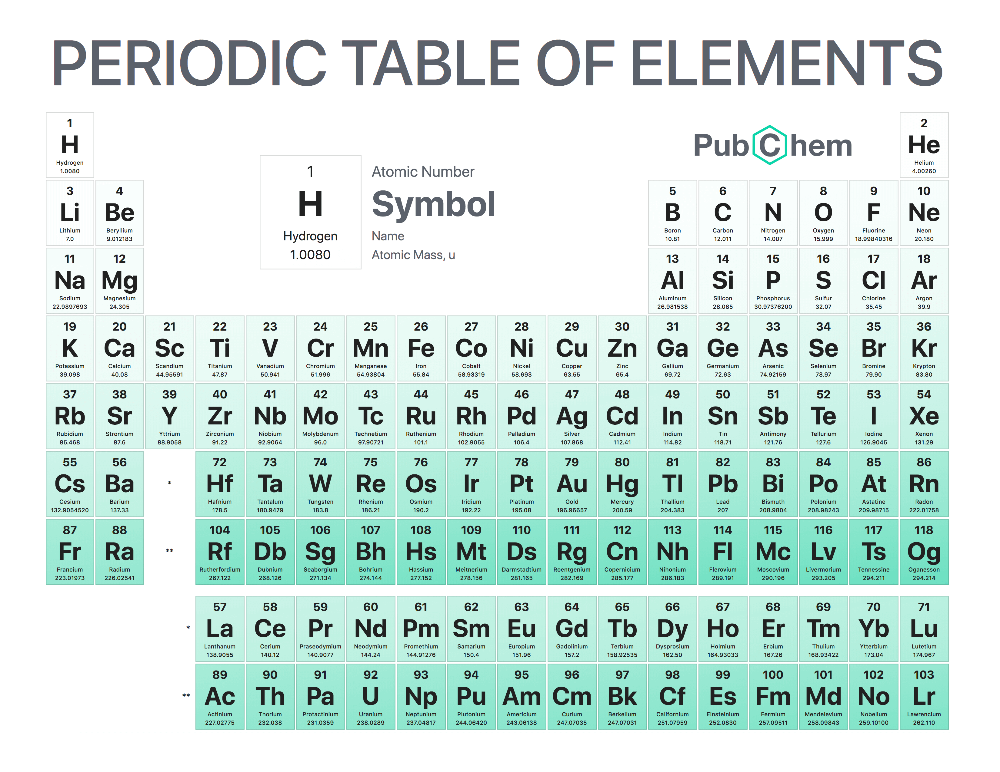

Figure 1: Periodic Table of Elements

##**Data Wrangling**

The first step of the process is to import different python packages that will aid in handling data, visualizing data, and perform statistics. 




In [ ]:
#@title Initial Packages To Import
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
!pip install pyrolite
from pyrolite.plot import pyroplot
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)


plt.rcParams['figure.figsize'] = (10.0, 10.0)


The next step is to mount Google Drive to this notebook and import the XRD and XRF data sets. The data was reported in two separate '.csv' files, one with the XRF data, and the other with the XRD data. 



In [ ]:
from google.colab import drive # this mounts Google Drive to this notebook
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
folder_path = 'gdrive/My Drive/GEOL_557/SoloProject/'
file_name_XRD = 'Dingo_XRD.csv'
file_name_XRF = 'Dingo_XRF.csv'

In [ ]:
# Assigning dataframes for the two files
df_XRD=pd.read_csv(folder_path + file_name_XRD) 
df_XRF=pd.read_csv(folder_path + file_name_XRF)

The files were already in a relatively easy to read format. However, in the XRD data file many measurements were reported as 'Tr' which means *trace amount*. This required changing those values to 0.1 wt%. Because text in the form of 'Tr' existed in some of the data columns, the data type for many of the columns were originally set as an *object*, therefore all the columns had to be changed to a numeric data type.

Two of the XRD column headers, illite-mica and illite-smectite, contained a dash so the dash was changed to an underscore. Also, plagioclase was originally misspelled, so that error was fixed as well.

Lastly, the depth column was set as the index for both the XRD and XRF dataframes. 

In [ ]:
df_XRD = df_XRD.replace('Tr', 0.1)    # Replacing all trace values (TR) as 0.1
df_XRD = df_XRD.apply(pd.to_numeric)    # Changing all datatypes to numeric
df_XRD = df_XRD.rename(columns={"Illite-mica":"I_M","Illite-smectite":"I_S", "Plagiolcase":"Plagioclase" })  # changing column names to replace dashes with underscores and correct a misspelled mineral column name.
df_XRD = df_XRD.set_index('Depth')   # set depth as the index
df_XRD.head()


,Quartz,Kspar,Plagioclase,Calcite,Dolomite,Siderite,Magnesite,Chlorite,Kaolinite,I_M,I_S,Pyrite,Apatite,TECTOSILICATES,CARBONATES,PHYLLOSILICATES,ADDITIONAL
Depth,,,,,,,,,,,,,,,,,
9355.97,53.5,4.4,12.3,0.1,8.2,0.0,0.0,0.0,0.0,20.3,0.1,1.3,0.1,70.2,8.2,20.3,1.3
9365.03,59.9,6.0,13.4,1.6,3.7,0.0,0.0,0.0,0.0,15.4,0.1,0.1,0.1,79.3,5.3,15.4,0.1
9374.97,56.9,5.8,11.9,5.0,12.9,0.0,0.0,0.0,0.0,7.5,0.1,0.1,0.1,74.6,17.9,7.5,0.1
9385.00,64.4,7.7,10.9,2.7,9.5,0.0,0.0,0.0,0.0,4.8,0.1,0.1,0.0,83.0,12.2,4.8,0.1
9395.01,55.2,5.5,11.9,12.8,3.4,0.0,0.0,0.0,0.0,9.7,0.1,1.5,0.0,72.6,16.2,9.7,1.5


In [ ]:

df_XRF = df_XRF.set_index('Depth')
df_XRF.head()

,SiO2,TiO2,Al2O3,Fe2O3,MnO,MgO,CaO,Na2O,K2O,P2O5,SO3,Cl,V,Cr,Co,Ni,Cu,Zn,Ga,As,Br,Rb,Sr,Y,Zr,Nb,Mo,Ba,Hf,Pb,Th,U
Depth,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
9355.97,69.95,0.64,13.66,1.93,0.03,2.44,3.26,1.60,2.36,0.11,1.79,0.00,50.0,100.0,8.8,30.2,26.7,17.4,10.6,4.1,1.4,56.3,103.5,20.4,351.1,13.1,10.4,278.0,10.7,5.2,4.0,0.2
9365.03,74.77,0.58,12.26,0.99,0.02,1.38,2.72,1.70,2.12,0.16,0.65,0.01,41.5,162.5,1.5,23.0,21.9,16.0,9.9,1.9,1.0,49.9,113.0,20.2,401.0,12.1,12.0,322.3,11.2,5.4,4.8,0.3
9374.97,71.13,0.39,9.15,2.08,0.06,2.32,8.16,1.60,1.66,0.13,0.29,0.00,15.2,132.7,1.5,22.9,5.4,7.6,5.7,2.5,0.7,41.3,168.8,16.2,233.6,7.6,11.4,408.8,3.8,4.2,2.1,0.2
9385.00,79.62,0.21,6.55,1.38,0.03,1.19,3.80,1.51,1.45,0.08,0.98,0.00,9.1,71.1,5.6,23.2,6.1,31.7,4.7,4.4,0.6,35.3,115.7,8.9,133.2,5.9,13.2,513.8,1.0,9.0,0.2,0.2
9395.01,70.53,0.43,9.78,1.66,0.03,1.32,7.23,1.56,1.81,0.09,2.55,0.00,22.8,135.3,1.5,31.7,8.6,7.2,9.1,3.6,0.7,44.3,196.3,15.9,253.2,9.6,10.8,412.1,3.0,10.4,2.1,0.2


##**Element Relationships**

The below chart (figure 2) is a pair grid made using Seaborn which allows for a way to visually compare each element's relationship to one another. The individual plots in the top-right half of the matrix are scatter plots, while the individual plots in the lower-left are bivariate distribution kernel density estimate plots.

A quick look allows us to see a strong positive correlation between Al2O3, TiO2, Na2O, K2O, Ga, Rb and Th. A strong negative correlation exists between SiO2 and CaO. 

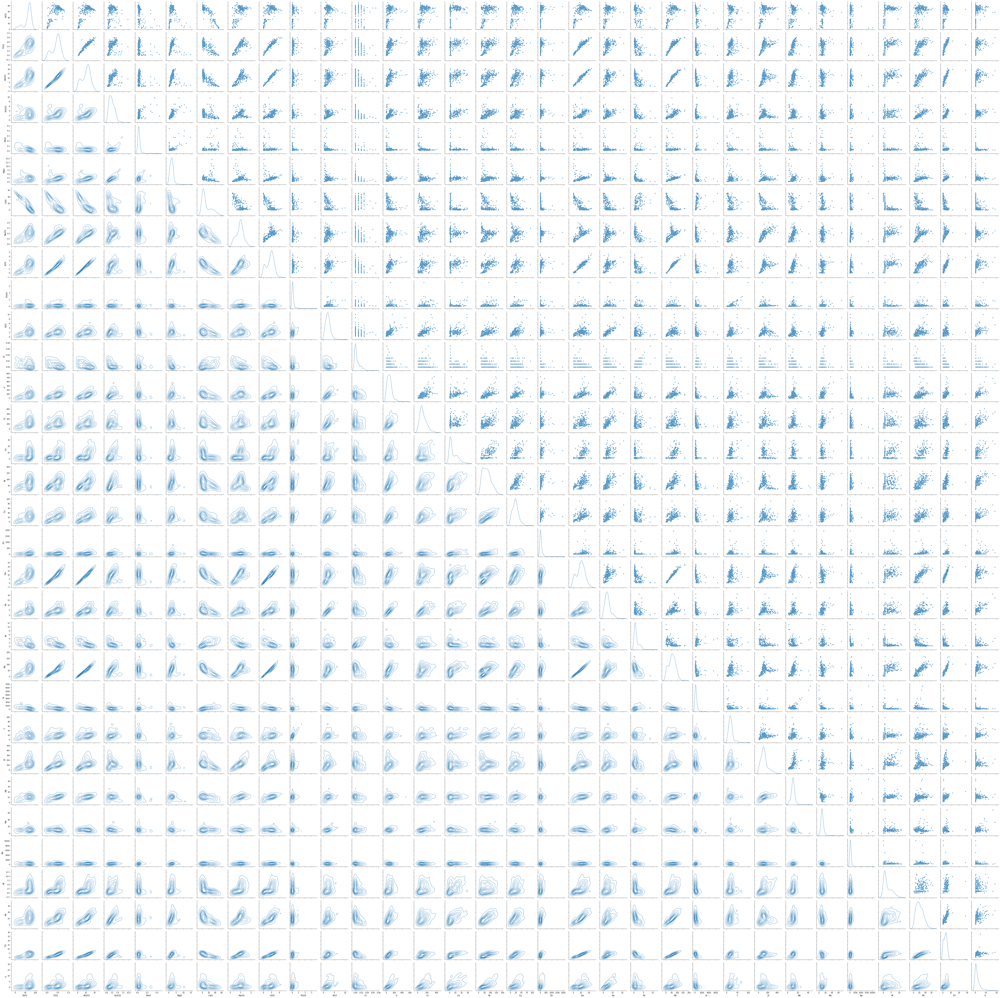

In [ ]:
g = sns.PairGrid(df_XRF,diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)


Figure 2: Pair-grid plot

The below plot (figure 3) is a pairwise pearson correlation matrix created as a Seaborn Heatmap plot. The color code is based on the degree of correlation, where dark purple represents a strong positive corelation, dark organge represents a strong negative correlation, and lighter shades represent no correlation.

A few of the strongest correlations are between Al2O3 and K2O (0.97), TiO2 and Al2O3 (0.96), Ga and Rb (0.98), Rb and K2O (0.96), and SiO2 and CaO (-0.90).

Fe2O3 and SO3 have a poor correlation coefficient of 0.21 indicating that iron exists in another form other than pyrite. Fe2O3 has a slightly better correlation coefficient with Mg potentially indicating the presence of chlorite and, or ferroan dolomite. SO3 could also exist as anhydrite, however, due to the negative correlation with CaO (-0.39) it is unlikely much, if any anhydrite is present.

P2O5 does not correlate well with anything except Y (0.77), which is a bit of an abnormal relationship. Zn also does not strongly correlate with any other element.

Uranium's correlation with other paleoredox elements is strongest with As (0.78), V (0.73) and Ni (0.71), and does less well with Zn (0.29), Mo (0.46), Cu (0.53). 

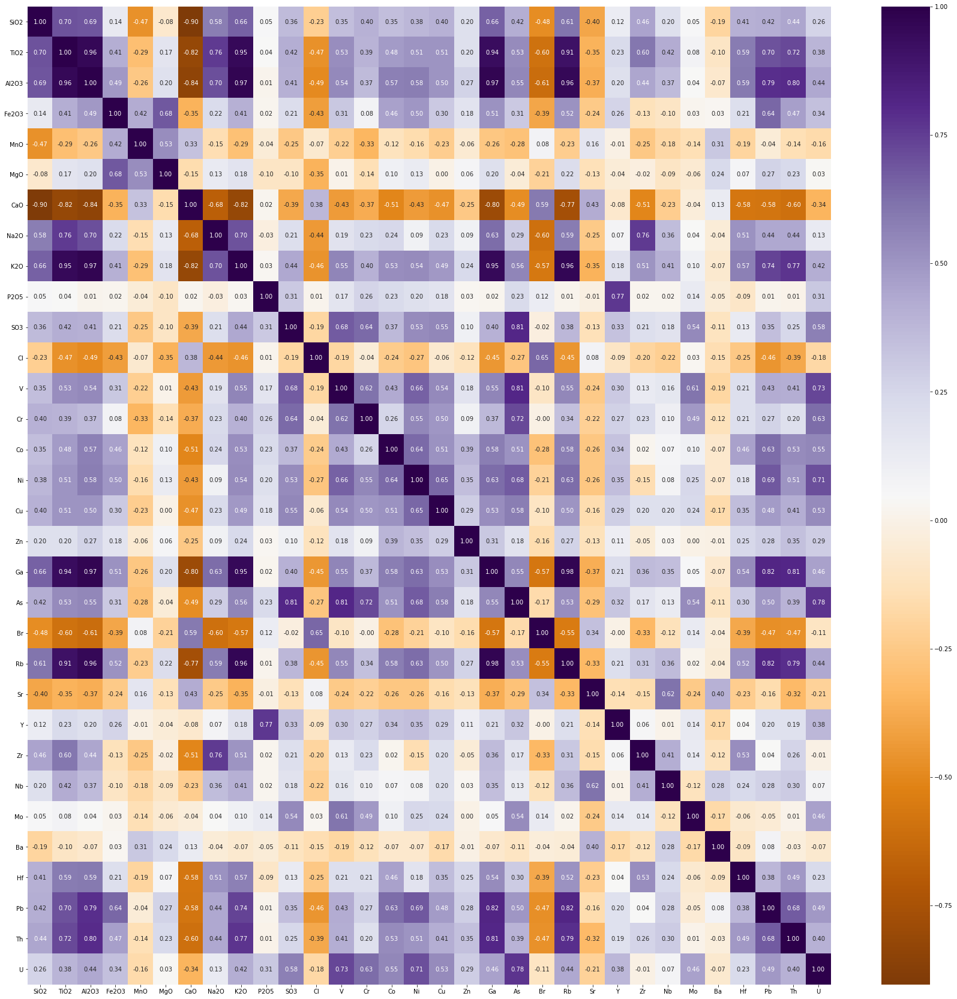

In [ ]:
corrMatrix = df_XRF.corr()

fig, ax = plt.subplots()

fig.set_size_inches(30, 30)

heatmap = sns.heatmap(corrMatrix, annot=True, fmt="0.2f", cmap="PuOr")
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)



fig.show()

Figure 3: Pearson Correlation Coefficient Matrix Heatmap plot

##**Creating logs of the different Major Elements**

A log view (figure 4) of the major elements can be helpful to see trends in the data with depth. 

In [ ]:
# I created a second dataframe in order to have one where depth is not the index and can be used as the Y-axis.
df_XRF3 = df_XRF
df_XRF3 = df_XRF3.reset_index() 


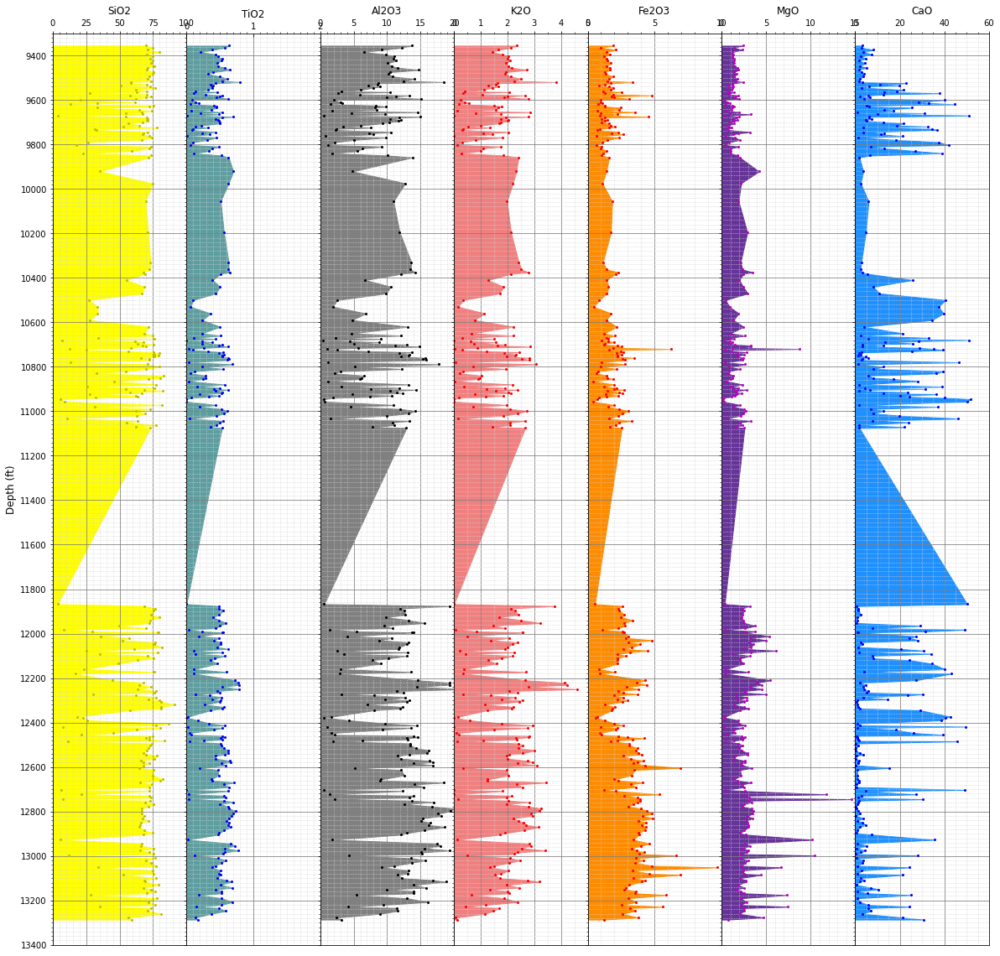

In [ ]:
#@title Show Log Plot Coding

fig, ax = plt.subplots(1,7,figsize=(20,20), sharey=True)
fig.subplots_adjust(wspace=0)

ax[1].tick_params(axis='x', direction='in')

ax[0].plot(df_XRF3.SiO2, df_XRF3.Depth, '.y')#color='goldenrod')
ax[0].set_title('SiO2')
ax[0].set_ylabel('Depth (ft)')
ax[0].set_ylim(13400,9300)
ax[0].set_xlim(0,100)
ax[0].xaxis.set_major_locator(MultipleLocator(25))
ax[0].xaxis.set_minor_locator(MultipleLocator(5))
ax[0].yaxis.set_major_locator(MultipleLocator(200))
ax[0].yaxis.set_minor_locator(MultipleLocator(20))
ax[0].grid(which='major', color='gray', linestyle='-')
ax[0].grid(which='minor', color='lightgray', linestyle=':')
ax[0].xaxis.tick_top()
ax[0].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.SiO2, color='yellow')


ax[1].plot(df_XRF3.TiO2, df_XRF3.Depth.values, '.b')#color='SteelBlue')
ax[1].set_title('TiO2')
ax[1].set_xlim(0,2)
ax[1].xaxis.set_major_locator(MultipleLocator(1))
ax[1].xaxis.set_minor_locator(MultipleLocator(.1))
ax[1].yaxis.set_major_locator(MultipleLocator(200))
ax[1].yaxis.set_minor_locator(MultipleLocator(20))
ax[1].grid(which='major', color='gray', linestyle='-')
ax[1].grid(which='minor', color='lightgray', linestyle=':')
ax[1].xaxis.tick_top()
ax[1].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.TiO2, color='cadetblue')

ax[2].plot(df_XRF3.Al2O3, df_XRF3.Depth.values, '.k')# color='DimGray')
ax[2].set_title('Al2O3')
ax[2].set_xlim(0,20)
ax[2].xaxis.set_major_locator(MultipleLocator(5))
ax[2].xaxis.set_minor_locator(MultipleLocator(1))
ax[2].yaxis.set_major_locator(MultipleLocator(200))
ax[2].yaxis.set_minor_locator(MultipleLocator(20))
ax[2].grid(which='major', color='gray', linestyle='-')
ax[2].grid(which='minor', color='lightgray', linestyle=':')
ax[2].xaxis.tick_top()
ax[2].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.Al2O3, color='gray')

ax[3].plot(df_XRF3.K2O, df_XRF3.Depth.values, '.r')#color='IndianRed')
ax[3].set_title('K2O')
ax[3].set_xlim(0,5)
ax[3].xaxis.set_major_locator(MultipleLocator(1))
ax[3].xaxis.set_minor_locator(MultipleLocator(.5))
ax[3].yaxis.set_major_locator(MultipleLocator(200))
ax[3].yaxis.set_minor_locator(MultipleLocator(20))
ax[3].grid(which='major', color='gray', linestyle='-')
ax[3].grid(which='minor', color='lightgray', linestyle=':')
ax[3].xaxis.tick_top()
ax[3].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.K2O, color='lightcoral')

ax[4].plot(df_XRF3.Fe2O3, df_XRF3.Depth.values, '.r')#color='orangered')
ax[4].set_title('Fe2O3')
ax[4].set_xlim(0,10)
ax[4].xaxis.set_major_locator(MultipleLocator(5))
ax[4].xaxis.set_minor_locator(MultipleLocator(1))
ax[4].yaxis.set_major_locator(MultipleLocator(200))
ax[4].yaxis.set_minor_locator(MultipleLocator(20))
ax[4].grid(which='major', color='gray', linestyle='-')
ax[4].grid(which='minor', color='lightgray', linestyle=':')
ax[4].xaxis.tick_top()
ax[4].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.Fe2O3, color='darkorange')

ax[5].plot(df_XRF3.MgO, df_XRF3.Depth.values, '.m')#color='indigo')
ax[5].set_title('MgO')
ax[5].set_xlim(0,15)
ax[5].xaxis.set_major_locator(MultipleLocator(5))
ax[5].xaxis.set_minor_locator(MultipleLocator(1))
ax[5].yaxis.set_major_locator(MultipleLocator(200))
ax[5].yaxis.set_minor_locator(MultipleLocator(20))
ax[5].grid(which='major', color='gray', linestyle='-')
ax[5].grid(which='minor', color='lightgray', linestyle=':')
ax[5].xaxis.tick_top()
ax[5].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.MgO, color='RebeccaPurple')


ax[6].plot(df_XRF3.CaO, df_XRF3.Depth.values, '.b')# color='blue')
ax[6].set_title('CaO')
ax[6].set_xlim(0,60)
ax[6].xaxis.set_major_locator(MultipleLocator(20))
ax[6].xaxis.set_minor_locator(MultipleLocator(5))
ax[6].yaxis.set_major_locator(MultipleLocator(200))
ax[6].yaxis.set_minor_locator(MultipleLocator(20))
ax[6].grid(which='major', color='gray', linestyle='-')
ax[6].grid(which='minor', color='lightgray', linestyle=':')
ax[6].xaxis.tick_top()
ax[6].fill_betweenx(df_XRF3.Depth, 0, df_XRF3.CaO, color='dodgerblue')


plt.show()

Figure 4: Depth plot of major elements
\
\
A key take away from the log view of the data is that it is highly interbedded between siliciclastic dominated lithologies and calcareous lithologies. There is also a 800' gap of missing data between ~11,100 feet and 11,900 feet. There are a few thin beds of predominately dolomite as well. Fe2O3 does not track that well with the other siliciclastic affinity elements when they decrease indicating an association with the more calcareous deposits in the form of siderite, ferroan dolomite or ferroan calcite. 

## **Grid plot of Minerals vs Elements**

Next we will look at some plots comparing minerals to elements in order to see how well they compare. Included in each plot is the ideal stoichiometric ratio between that element and mineral.

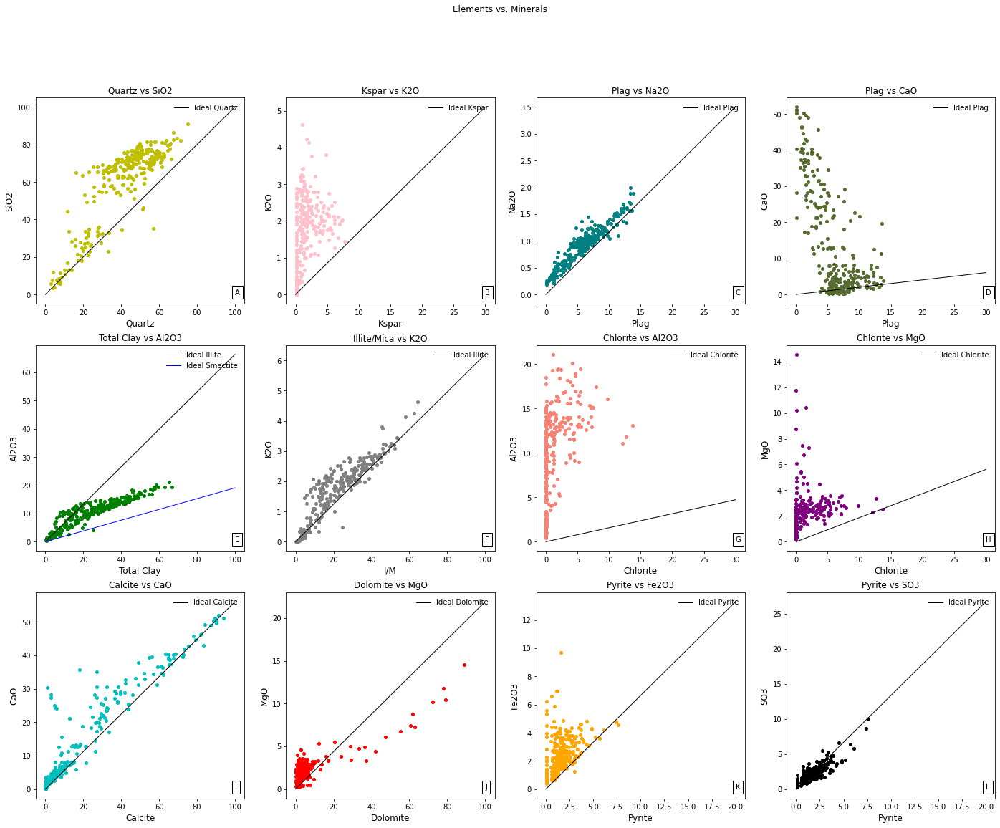

In [ ]:
#@title Mineral vs Element Cross Plot Coding
fig, ((ax1,ax2,ax3,ax4), (ax5,ax6,ax7,ax8), (ax9,ax10,ax11,ax12)) = plt.subplots(3,4, figsize=(24,18), )

from matplotlib.collections import LineCollection

fig.suptitle('Elements vs. Minerals')

ax1.scatter(df_XRD.Quartz, df_XRF.SiO2, c='y', marker='o')
ax1.set_title('Quartz vs SiO2')
ax1.plot([0,100],[0,100],'k-', label='Ideal Quartz')
ax1.set_xlabel('Quartz')
ax1.set_ylabel('SiO2')
ax1.legend(loc='upper right')
ax1.text(100,0,"A", bbox=dict(facecolor='none'))

ax2.scatter(df_XRD.Kspar, df_XRF.K2O, c='pink', marker='o')
ax2.set_title('Kspar vs K2O')
ax2.plot([0,30],[0,5.1],'k-', label='Ideal Kspar') #kspar
ax2.set_xlabel('Kspar')
ax2.set_ylabel('K2O')
ax2.legend(loc='upper right')
ax2.text(30,0,"B", bbox=dict(facecolor='none'))

ax3.scatter(df_XRD.Plagioclase, df_XRF.Na2O, c='teal', marker='o')
ax3.set_title('Plag vs Na2O')
ax3.plot([0,30],[0,3.5],'k-', label='Ideal Plag')
ax3.set_xlabel('Plag')
ax3.set_ylabel('Na2O')
ax3.legend(loc='upper right')
ax3.text(30,0,"C", bbox=dict(facecolor='none'))

ax4.scatter(df_XRD.Plagioclase, df_XRF.CaO, c='darkolivegreen', marker='o')
ax4.set_title('Plag vs CaO')
ax4.plot([0,30],[0,6.04],'k-', label='Ideal Plag')
ax4.set_xlabel('Plag')
ax4.set_ylabel('CaO')
ax4.legend(loc='upper right')
ax4.text(30, 0, "D", bbox=dict(facecolor='none'))

ax5.scatter(df_XRD.PHYLLOSILICATES, df_XRF.Al2O3, c='g', marker='o')
ax5.set_title('Total Clay vs Al2O3')
ax5.plot([0,100],[0,66.4],'k-', label='Ideal Illite') #Illite
ax5.plot([0,100],[0,19.1],'b-', label='Ideal Smectite') #Smectite
ax5.set_xlabel('Total Clay')
ax5.set_ylabel('Al2O3')
ax5.legend(loc='upper right')
ax5.text(100,0,"E", bbox=dict(facecolor='none'))

ax6.scatter(df_XRD.I_M, df_XRF.K2O, c='gray', marker='o')
ax6.set_title('Illite/Mica vs K2O')
ax6.plot([0,100],[0,6.2],'k-', label='Ideal Illite')
ax6.set_xlabel('I/M')
ax6.set_ylabel('K2O')
ax6.legend(loc='upper right')
ax6.text(100,0,"F", bbox=dict(facecolor='none'))

ax7.scatter(df_XRD.Chlorite, df_XRF.Al2O3, c='salmon', marker='o')
ax7.set_title('Chlorite vs Al2O3')
ax7.plot([0,30],[0,4.73],'k-', label='Ideal Chlorite')
ax7.set_xlabel('Chlorite')
ax7.set_ylabel('Al2O3')
ax7.legend(loc='upper right')
ax7.text(30,0,"G", bbox=dict(facecolor='none'))

ax8.scatter(df_XRD.Chlorite, df_XRF.MgO, c='purple', marker='o')
ax8.set_title('Chlorite vs MgO')
ax8.plot([0,30],[0,5.61],'k-', label='Ideal Chlorite')
ax8.set_xlabel('Chlorite')
ax8.set_ylabel('MgO')
ax8.legend(loc='upper right')
ax8.text(30,0,"H", bbox=dict(facecolor='none'))

ax9.scatter(df_XRD.Calcite, df_XRF.CaO, c='c', marker='o')
ax9.set_title('Calcite vs CaO')
ax9.plot([0,100],[0,56.0],'k-', label='Ideal Calcite') #calcite
ax9.set_xlabel('Calcite')
ax9.set_ylabel('CaO')
ax9.legend(loc='upper right')
ax9.text(100,0,"I", bbox=dict(facecolor='none'))

ax10.scatter(df_XRD.Dolomite, df_XRF.MgO, c='red', marker='o')
ax10.set_title('Dolomite vs MgO')
ax10.plot([0,100],[0,21.9],'k-', label='Ideal Dolomite')
ax10.set_xlabel('Dolomite')
ax10.set_ylabel('MgO')
ax10.legend(loc='upper right')
ax10.text(100,0,"J", bbox=dict(facecolor='none'))

ax11.scatter(df_XRD.Pyrite, df_XRF.Fe2O3, c='orange', marker='o')
ax11.set_title('Pyrite vs Fe2O3')
ax11.plot([0,20],[0,13.3],'k-', label='Ideal Pyrite')
ax11.set_xlabel('Pyrite')
ax11.set_ylabel('Fe2O3')
ax11.legend(loc='upper right')
ax11.text(20,0,"K", bbox=dict(facecolor='none'))

ax12.scatter(df_XRD.Pyrite, df_XRF.SO3, c='black', marker='o')
ax12.set_title('Pyrite vs SO3')
ax12.plot([0,20],[0,26.7],'k-', label='Ideal Pyrite')
ax12.set_xlabel('Pyrite')
ax12.set_ylabel('SO3')
ax12.legend(loc='upper right')
ax12.text(20,0,"L", bbox=dict(facecolor='none'))

fig.show()

Figure 5: Mineral vs element relationship plots

These plots are really telling in that it shows what the relationships are between a mineral and one of its elements. 
- The relationship between Quartz and SiO2 (fig 5A)indicates that silica exists in more than just quartz. All data points should be above the ideal quartz line which suggests there are a couple samples that should be reevaluated as there cannot be more quartz than SiO2.
- The Kspar vs K2O plot (fig 5B) tells us that most of the K2O is not associated with Kspar, and is likely more related to illite.
- The Plag vs Na2O (fig 5C) and Plag vs CaO (fig 5D) plots are telling in that the type of plagioclase we are seeing is probably albite as opposed to anorthite based on the strong relationship between Na2O and Plag. 
- The Total Clay vs Al2O3 plot (fig 5E) suggests aluminum is strongly associated with clay. Based on the ideal illite and smectite lines, there must exist a mixture of both illite and smectite.
- The Illite/Mica vs K2O plot (fig 5F) suggests that most of the K2O exists as Illite. The pull of the data points above the ideal illite line suggest the presence of illite/smectite as well.
- The Chlorite vs Al2O3 plot (fig 5G) suggests that chlorite is not a main clay fraction in the rock. The Chlorite vs MgO plot (Fig 5H) does indicate that some chlorite likely exists and the lower levels of MgO *may* be associated with chlorite.
- the Calcite vs CaO plot (fig 5I) indicates that most CaO is related to calcite, however, the pull of the data toward 30% CaO and low calcite values indicate the presence of dolomite also exists in those samples. 
- The Dolomite vs MgO plot (fig 5J) indicates the presence of dolomite at the higher values. The pull of the data below the ideal dolomite suggests a ferroan dolomite. The MgO also has another affinity as seen in the MgO data points that are plotting above the ideal dolomite line, up to 5% MgO where dolomite is near zero.
- The Pyrite vs Fe2O3 plot (fig 5K) suggests pyrite exists, but iron is also associated with other minerals. In the Pyrite vs SO3 plot (fig 5L), there is a strong linear correlation with the ideal pyrite line indicating that sulfur is predominately associated with just pyrite. 

##**Cluster Analysis**

Cluster analysis was performed for two reasons. The first is that it can provide a quick way to statistically determine chemo-zones that could be related to facies or subfacies. I will discuss the second reason when I divide the dataset into training and testing data subsets later on.





In [ ]:
#@title Import packages that will be used for statistical analysis
#Importing packages that will be used for the statistical analysis going forward

%matplotlib inline

from sklearn import preprocessing
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression, PLSSVD
from sklearn.metrics import mean_squared_error
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import mean_squared_error

from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import pairwise_distances
from matplotlib import legend_handler

In [ ]:
df_XRF.describe()

,SiO2,TiO2,Al2O3,Fe2O3,MnO,MgO,CaO,Na2O,K2O,P2O5,SO3,Cl,V,Cr,Co,Ni,Cu,Zn,Ga,As,Br,Rb,Sr,Y,Zr,Nb,Mo,Ba,Hf,Pb,Th,U
count,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000
mean,61.335944,0.419196,10.044720,2.471014,0.039301,2.251573,13.206783,0.925734,1.709406,0.152587,2.131154,0.006189,87.198252,121.526923,6.354895,68.642308,23.443357,84.752448,9.437413,4.792308,1.446503,55.304196,372.485315,19.553147,127.344056,10.605944,10.758741,447.930769,2.760839,10.710140,3.245105,1.972727
std,20.245210,0.201360,4.989741,1.318133,0.052817,1.670144,14.572864,0.358912,0.950592,0.289730,1.244640,0.010454,72.100892,73.374278,6.647070,33.709911,14.150249,179.434721,5.192690,3.136208,1.457288,30.292937,613.940541,11.652499,75.971695,4.440981,6.240258,840.730827,2.533399,5.976856,2.510377,2.729236
min,3.600000,0.000000,0.450000,0.410000,0.010000,0.210000,0.170000,0.190000,0.000000,0.000000,0.260000,0.000000,0.500000,9.100000,0.100000,16.500000,0.300000,5.100000,0.300000,0.100000,0.100000,0.700000,57.600000,0.300000,9.900000,1.400000,0.300000,49.500000,0.100000,0.600000,0.200000,0.200000
25%,57.720000,0.280000,6.107500,1.440000,0.020000,1.322500,1.912500,0.700000,1.065000,0.040000,1.372500,0.000000,39.050000,73.000000,1.500000,39.150000,12.600000,15.400000,5.950000,2.800000,0.600000,33.825000,118.475000,12.900000,85.125000,8.700000,8.200000,211.850000,1.000000,6.000000,1.500000,0.200000
50%,69.585000,0.480000,11.035000,2.240000,0.020000,2.070000,5.595000,0.965000,1.920000,0.080000,1.980000,0.000000,77.200000,102.700000,1.550000,66.600000,22.400000,24.250000,9.850000,4.300000,0.900000,54.700000,217.550000,17.800000,114.600000,10.550000,9.750000,293.800000,1.100000,9.700000,3.250000,0.800000
75%,74.347500,0.560000,13.580000,3.325000,0.040000,2.677500,24.180000,1.150000,2.377500,0.140000,2.655000,0.010000,114.225000,162.175000,10.875000,90.175000,30.600000,86.850000,13.000000,6.000000,1.800000,75.250000,364.400000,23.875000,152.950000,12.200000,12.000000,412.375000,4.500000,14.875000,4.700000,2.600000
max,91.080000,0.800000,21.080000,9.680000,0.450000,14.550000,51.920000,2.000000,4.620000,3.550000,9.980000,0.070000,519.700000,412.900000,29.600000,165.700000,91.300000,1941.000000,23.100000,21.300000,11.100000,165.400000,6515.000000,99.100000,418.800000,44.000000,69.200000,10150.000000,11.200000,32.200000,28.200000,18.400000


\
First step is to scale the data. This processes entails calculating the z-scores, which are scores that have been given a mean of 0 and a standard deviation of 1. This resutls in a somewhat normally distributed data set between -1 and 1.


In [ ]:
normalized_XRF = preprocessing.scale(df_XRF)
normalized_XRF = pd.DataFrame(normalized_XRF)
normalized_XRF

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,0.426232,1.098489,0.725813,-0.411159,-0.176400,0.113018,-0.683752,1.881933,0.685610,-0.147248,-0.274579,-0.593049,-0.516824,-0.293899,0.368492,-1.142385,0.230551,-0.376017,0.224282,-0.221134,-0.031967,0.032930,-0.438897,0.072803,2.950417,0.562585,-0.057589,-0.202477,3.139291,-0.923529,0.301237,-0.650671
1,0.664730,0.799992,0.444745,-1.125539,-0.366063,-0.522770,-0.720872,2.161042,0.432693,0.025629,-1.192112,0.365211,-0.634921,0.559391,-0.731661,-1.356346,-0.109260,-0.383833,0.089240,-0.923847,-0.306930,-0.178711,-0.423396,0.055609,3.608392,0.337014,0.199260,-0.149692,3.337000,-0.890008,0.620473,-0.613967
2,0.484619,-0.145248,-0.179626,-0.297162,0.392590,0.041042,-0.346921,1.881933,-0.052065,-0.078097,-1.481859,-0.593049,-1.000327,0.152542,-0.731661,-1.359318,-1.277362,-0.430729,-0.721007,-0.732198,-0.513153,-0.463103,-0.332349,-0.288266,1.401077,-0.678051,0.102942,-0.046625,0.410903,-1.091134,-0.456948,-0.650671
3,0.904713,-1.040738,-0.701609,-0.829147,-0.176400,-0.636732,-0.646631,1.630735,-0.273367,-0.250974,-0.926510,-0.593049,-1.085079,-0.688461,-0.113767,-1.350403,-1.227806,-0.296183,-0.913922,-0.125309,-0.581894,-0.661516,-0.418991,-0.915840,0.077216,-1.061521,0.391897,0.078485,-0.696268,-0.286629,-1.215133,-0.650671
4,0.454931,0.053750,-0.053146,-0.616353,-0.176400,-0.558758,-0.410850,1.770290,0.106008,-0.216398,0.337110,-0.593049,-0.894734,0.188039,-0.731661,-1.097810,-1.050821,-0.432962,-0.065092,-0.380841,-0.513153,-0.363896,-0.287478,-0.314057,1.659520,-0.226911,0.006623,-0.042693,0.094569,-0.051981,-0.456948,-0.650671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,0.589024,0.302498,0.288150,0.546414,-0.366063,0.202988,-0.501588,-0.099737,-0.030988,-0.147248,0.304916,-0.593049,-0.158365,-0.550569,0.112292,0.780296,0.322583,0.180032,0.204990,-0.093368,-0.719376,0.151978,-0.266592,0.072803,-0.530653,-0.249468,-0.491022,-0.302446,-0.696268,0.802806,0.301237,-0.357035
282,0.487094,0.849742,0.300196,0.820006,-0.366063,0.178996,-0.416349,0.151460,-0.252290,0.233082,0.296867,-0.593049,-0.044436,-0.562856,-0.626167,0.405864,0.612838,0.224695,0.359323,-0.444724,-0.581894,-0.013366,-0.130837,0.683182,-0.259024,-0.204354,-0.587340,-0.276352,-0.459017,1.020693,0.540664,-0.503853
283,0.982893,-0.244746,-0.219779,0.082827,-0.555726,-0.126902,-0.676877,-0.378846,-0.589513,-0.181823,-0.314821,0.365211,-0.350099,-0.673443,0.730186,0.408835,0.839379,1.048720,0.320740,-0.316958,-0.719376,-0.353976,-0.347850,-0.417220,-0.742945,-0.790836,-0.394703,-0.303161,-0.696268,0.065343,-0.057903,-0.283626
284,-0.248194,-1.438733,-1.540796,0.994801,0.202926,1.474565,0.547399,-0.881241,-1.727639,-0.285549,-0.773588,-0.593049,-0.969761,-0.479575,-0.731661,-0.485642,-0.937550,-0.247612,-1.492670,-1.051613,-0.169449,-1.577523,0.319180,-0.511786,-1.075229,-1.377319,0.022676,-0.337954,-0.696268,-1.325781,-1.095420,-0.650671


\
Next step is to determine the number of clusters. There are several approaches, but the silhouette score method will be used. Silhouette analysis can be used to study the separation distance between the resulting clusters.  The below plot (figure 6) shows the silhouette score with increasing number of clusters. The higher the value, the more separation there is for the cluster. For the below plot, the highest coefficent is 2. Using domain knowledge, 2 cluster groupings is not all that helpful for evaluting a multi-variable data set.

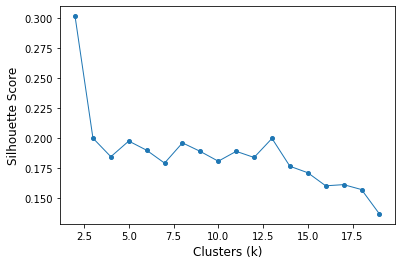

In [ ]:
#Average silhouette method
k = list(range(2,20))
score=[]

for n_cluster in k:
    km = KMeans(n_clusters=n_cluster).fit(normalized_XRF)
    silhouette_avg = silhouette_score(normalized_XRF, km.labels_)
    score.append(silhouette_score(normalized_XRF, km.labels_))
    
plt.plot(k, score, 'o-')
plt.xlabel("Clusters (k)")
plt.ylabel("Silhouette Score")
plt.show()

Figure 6: Silhouette Score vs Number of Clusters

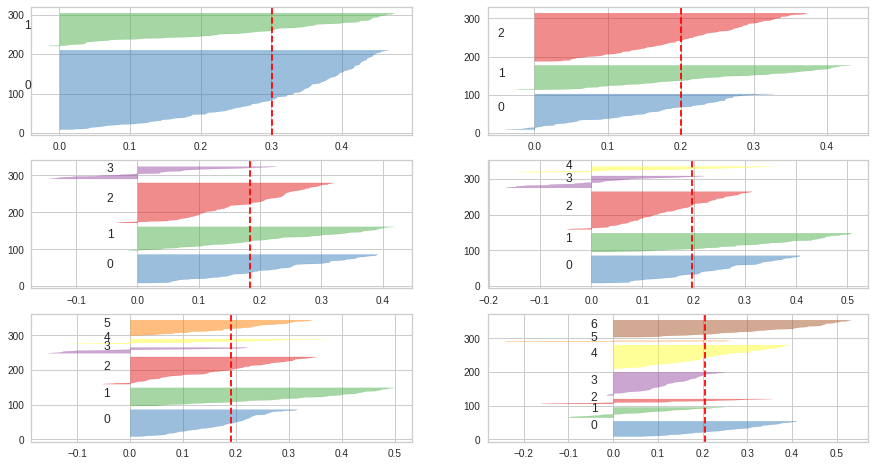

In [ ]:
#@title Silhouette Plots coding 

#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam

from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(3, 2, figsize=(15,8))
for i in [2, 3, 4, 5, 6, 7]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(normalized_XRF)

Figure 7: Silhouette Plot

The above silhouette plots (figure 7) show a measure of how close each point in one cluster is to points in the neighboring cluster which allows for a way to assess the number of clusters visually. The y-axis thickness of each cluster represents the number of samples in the cluster, and the x-axis represents the silhouette coefficient. Ideally, the optimal choice for number of clusters is where the silhouette coefficient is above the mean and the number of samples in each cluster is similar. A negative coefficient indicates data points overlay other clusters. When dealing with as many variables as I am, some overlying data points are ok, and domain knowledge needs to be factored in. \
\
The above plots suggest three clusters would be ideal based on similar thickness and limited negative coefficients. \

\

The below three charts show K-Means clustering based on incremental number of clusters. The top chart are the Z-scores of SiO2 vs CaO, the middle chart are the z-scores of SiO2 vs Al2O3, and the bottom chart are the z-scores of Ni vs U. 

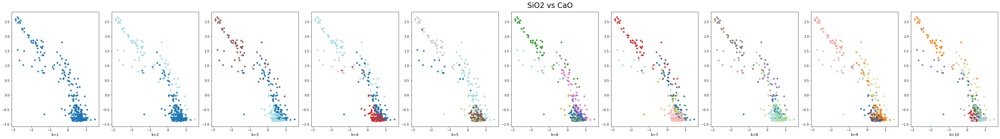

In [ ]:
#@title Incremental Clusters Coding - SiO2 vs CaO
#https://glowingpython.blogspot.com/2019/01/a-visual-introduction-to-gap-statistics.html


plt.figure(figsize=(50, 6))
for k in range(1,11):
    kmeans = KMeans(n_clusters=k)
    a = kmeans.fit_predict(normalized_XRF)
    plt.subplot(1,11,k)
    plt.scatter(normalized_XRF.values[:, 0], normalized_XRF.values[:, 6], c=a, cmap='tab20')
    plt.xlabel('k='+str(k))
plt.tight_layout()
plt.suptitle('SiO2 vs CaO', y=1.05, size=24)
plt.show();


Figure 8-A

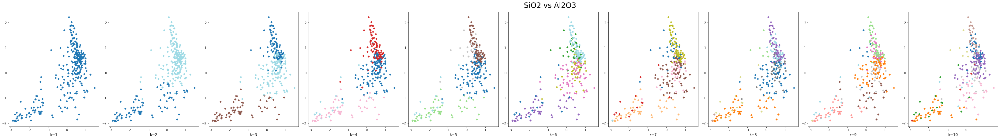

In [ ]:
#@title Incremental Clusters Coding - SiO2 vs Al2O3
plt.figure(figsize=(50, 6))
for k in range(1,11):
    kmeans = KMeans(n_clusters=k)
    a = kmeans.fit_predict(normalized_XRF)
    plt.subplot(1,11,k)
    plt.scatter(normalized_XRF.values[:, 0], normalized_XRF.values[:, 2], c=a, cmap='tab20')
    plt.xlabel('k='+str(k))
plt.tight_layout()
plt.suptitle('SiO2 vs Al2O3', y=1.05, size=24)
plt.show();

Figure 8-B

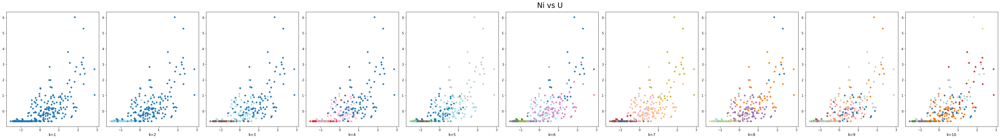

In [ ]:
#@title Incremental Clusters Coding - Ni vs U
plt.figure(figsize=(50, 6))
for k in range(1,11):
    kmeans = KMeans(n_clusters=k)
    a = kmeans.fit_predict(normalized_XRF)
    plt.subplot(1,11,k)
    plt.scatter(normalized_XRF.values[:, 15], normalized_XRF.values[:, 31], c=a, cmap='tab20')
    plt.xlabel('k='+str(k))
plt.tight_layout()
plt.suptitle('Ni vs U', y=1.05, size=24)
plt.show();

Figure 8-C

Based on the above incremental plots (Figure 8 A-C), it looks like 5 clusters might be the right number to go with, even though the silhouette method suggested 3. Based on the above incremental plots, it looks like we can differentiate clusters that contain higher amounts of dolomite relative to higher amounts of calcite that might be lumped into one cluster if we only went with three. Furthermore, an additional cluster appears to help differentiate paleo-redox sensitive elements, which from a domain knowledge perspective, could identify higher organic rich intervals. 

\

The next step is to perform KMeans clustering

In [ ]:
k = 5 #Number of Clusters

kmeans= KMeans(n_clusters=k, random_state=0)

y_pred = kmeans.fit_predict(normalized_XRF)


In [ ]:


kmeans.labels_ == y_pred

In [ ]:

kmeans.cluster_centers_

Below (figure 9) is a histogram plot of the KMeans clustering distribution.

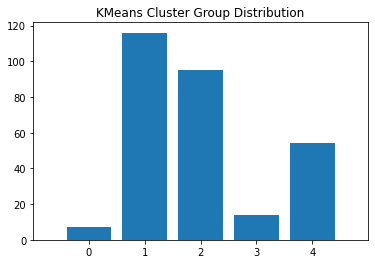

In [ ]:
bins = np.arange(6) - 0.5
data = kmeans.labels_
plt.hist(data, bins, rwidth=0.8)
plt.xticks(range(5))
plt.xlim([-1, 5])
plt.title("KMeans Cluster Group Distribution")

plt.show()

Figure 9: Histogram of KMeans cluster group

In [ ]:
# creating a dataframe for each samples cluster group
clustergroup = pd.DataFrame(y_pred, columns={'KM_Cluster_Group'})
clustergroup

In [ ]:
# Creating a dataframe to import the cluster group
df_XRF2 = df_XRF
df_XRF2


In [ ]:
# adding the cluster group to the dataframe
df_XRF2 = df_XRF2.reset_index()
df_XRF2 = pd.concat([df_XRF2, clustergroup],axis=1)
df_XRF2

,Depth,SiO2,TiO2,Al2O3,Fe2O3,MnO,MgO,CaO,Na2O,K2O,P2O5,SO3,Cl,V,Cr,Co,Ni,Cu,Zn,Ga,As,Br,Rb,Sr,Y,Zr,Nb,Mo,Ba,Hf,Pb,Th,U,KM_Cluster_Group
0,9355.97,69.95,0.64,13.66,1.93,0.03,2.44,3.26,1.60,2.36,0.11,1.79,0.00,50.0,100.0,8.8,30.2,26.7,17.4,10.6,4.1,1.4,56.3,103.5,20.4,351.1,13.1,10.4,278.0,10.7,5.2,4.0,0.2,1
1,9365.03,74.77,0.58,12.26,0.99,0.02,1.38,2.72,1.70,2.12,0.16,0.65,0.01,41.5,162.5,1.5,23.0,21.9,16.0,9.9,1.9,1.0,49.9,113.0,20.2,401.0,12.1,12.0,322.3,11.2,5.4,4.8,0.3,1
2,9374.97,71.13,0.39,9.15,2.08,0.06,2.32,8.16,1.60,1.66,0.13,0.29,0.00,15.2,132.7,1.5,22.9,5.4,7.6,5.7,2.5,0.7,41.3,168.8,16.2,233.6,7.6,11.4,408.8,3.8,4.2,2.1,0.2,1
3,9385.00,79.62,0.21,6.55,1.38,0.03,1.19,3.80,1.51,1.45,0.08,0.98,0.00,9.1,71.1,5.6,23.2,6.1,31.7,4.7,4.4,0.6,35.3,115.7,8.9,133.2,5.9,13.2,513.8,1.0,9.0,0.2,0.2,1
4,9395.01,70.53,0.43,9.78,1.66,0.03,1.32,7.23,1.56,1.81,0.09,2.55,0.00,22.8,135.3,1.5,31.7,8.6,7.2,9.1,3.6,0.7,44.3,196.3,15.9,253.2,9.6,10.8,412.1,3.0,10.4,2.1,0.2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,13233.95,73.24,0.48,11.48,3.19,0.02,2.59,5.91,0.89,1.68,0.11,2.51,0.00,75.8,81.2,7.1,94.9,28.0,117.0,10.5,4.5,0.4,59.9,209.1,20.4,87.1,9.5,7.7,194.1,1.0,15.5,4.0,1.0,1
282,13247.03,71.18,0.59,11.54,3.55,0.02,2.55,7.15,0.98,1.47,0.22,2.50,0.00,84.0,80.3,2.2,82.3,32.1,125.0,11.3,3.4,0.6,54.9,292.3,27.5,107.7,9.7,7.1,216.0,1.6,16.8,4.6,0.6,1
283,13259.95,81.20,0.37,8.95,2.58,0.01,2.04,3.36,0.79,1.15,0.10,1.74,0.01,62.0,72.2,11.2,82.4,35.3,272.6,11.1,3.8,0.4,44.6,159.3,14.7,71.0,7.1,8.3,193.5,1.0,11.1,3.1,1.2,1
284,13277.03,56.32,0.13,2.37,3.78,0.05,4.71,21.17,0.61,0.07,0.07,1.17,0.00,17.4,86.4,1.5,52.3,10.2,40.4,1.7,1.5,1.2,7.6,568.1,13.6,45.8,4.5,10.9,164.3,1.0,2.8,0.5,0.2,4


The below plots (figures 10 and 11) show how the different KMeans clusters break out in the different elemental relationships

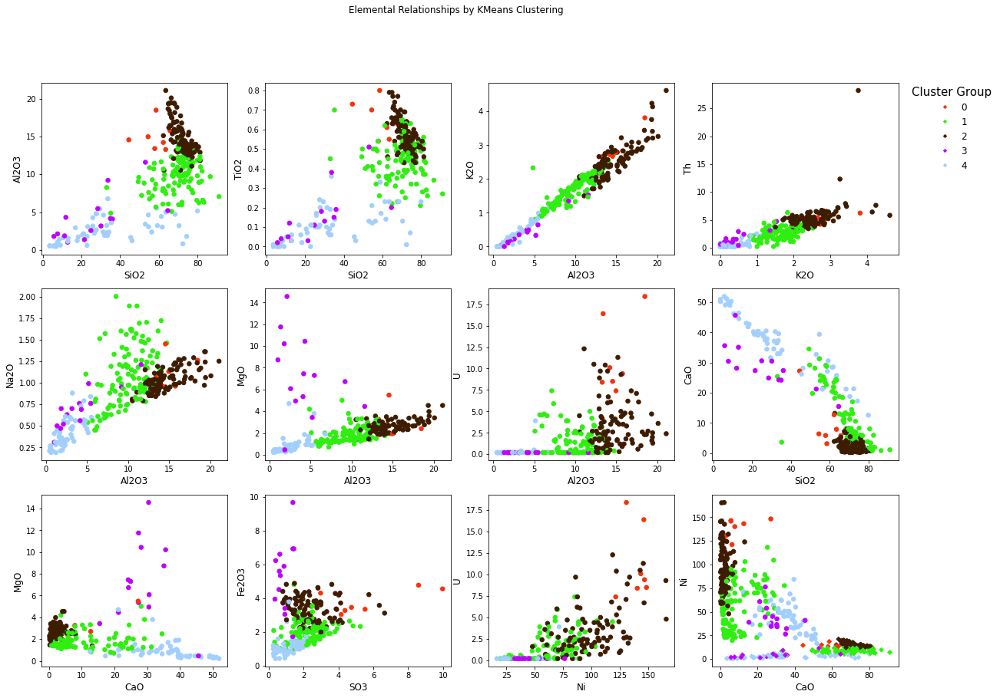

In [ ]:
#@title Elemental Relationships by KMeans Clustering Coding

fig, ((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8),(ax9,ax10,ax11,ax12)) = plt.subplots(3,4, figsize=(20,14), )

fig.suptitle('Elemental Relationships by KMeans Clustering')

classes = ['0','1','2','3', '4', '5', '6']
values = df_XRF2.KM_Cluster_Group

label = ['0','1','2','3', '4', '5', '6']
colors = ['xkcd:vermillion', 'xkcd:vivid green', 'xkcd:chocolate', 'xkcd:bright purple', 'xkcd:baby blue']

scatter = plt.scatter(df_XRF2.SiO2, df_XRF2.Al2O3, c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax4.legend(handles=scatter.legend_elements()[0], labels=classes, title='Cluster Group', fontsize='12',title_fontsize='15',bbox_to_anchor=(1.05,1), loc='upper left', borderaxespad=0)



ax1.scatter(df_XRF2.SiO2, df_XRF2.Al2O3, c=values, marker='o', s=30, label=label, cmap=matplotlib.colors.ListedColormap(colors))
ax1.set_ylabel('Al2O3')
ax1.set_xlabel('SiO2')

ax2.scatter(df_XRF2.SiO2, df_XRF2.TiO2, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax2.set_ylabel('TiO2')
ax2.set_xlabel('SiO2')

ax3.scatter(df_XRF2.Al2O3, df_XRF2.K2O, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax3.set_ylabel('K2O')
ax3.set_xlabel('Al2O3')

ax4.scatter(df_XRF2.K2O, df_XRF2.Th, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax4.set_ylabel('Th')
ax4.set_xlabel('K2O')

ax5.scatter(df_XRF2.Al2O3, df_XRF2.Na2O, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax5.set_ylabel('Na2O')
ax5.set_xlabel('Al2O3')

ax6.scatter(df_XRF2.Al2O3, df_XRF2.MgO, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax6.set_ylabel('MgO')
ax6.set_xlabel('Al2O3')

ax7.scatter(df_XRF2.Al2O3, df_XRF2.U, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax7.set_ylabel('U')
ax7.set_xlabel('Al2O3')

ax8.scatter(df_XRF2.SiO2, df_XRF2.CaO, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax8.set_ylabel('CaO')
ax8.set_xlabel('SiO2')

ax9.scatter(df_XRF2.CaO, df_XRF2.MgO, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax9.set_ylabel('MgO')
ax9.set_xlabel('CaO')

ax10.scatter(df_XRF2.SO3, df_XRF2.Fe2O3, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax10.set_ylabel('Fe2O3')
ax10.set_xlabel('SO3')

ax11.scatter(df_XRF2.Ni, df_XRF2.U, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax11.set_ylabel('U')
ax11.set_xlabel('Ni')

ax12.scatter(df_XRF2.CaO, df_XRF2.Ni, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax12.set_ylabel('Ni')
ax12.set_xlabel('CaO')

fig.show()

Figure 10: Elemental Relationships by KMeans Cluster Group

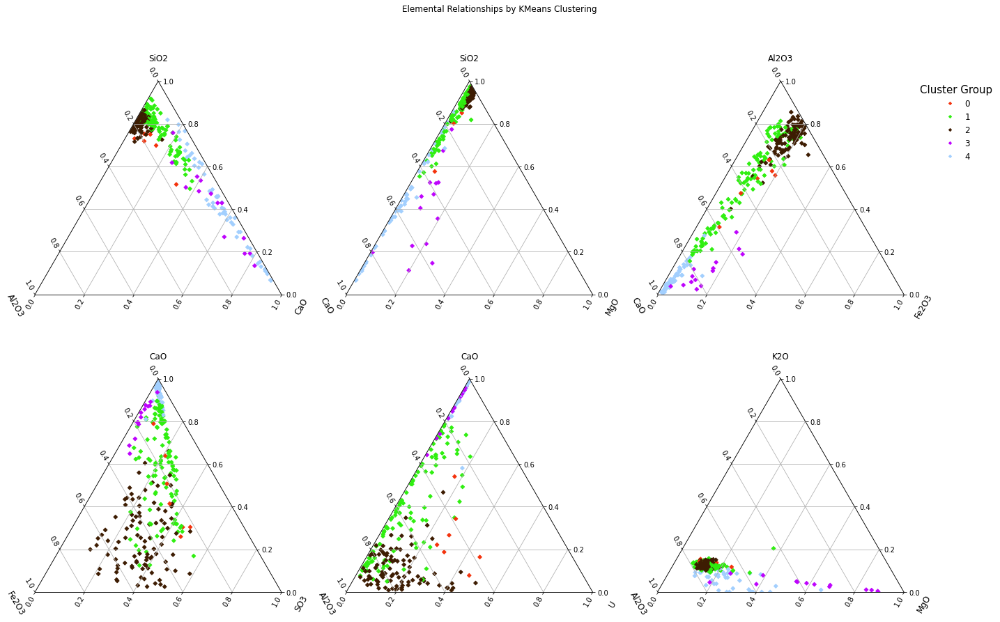

In [ ]:
#@title Elemental Relationships by KMeans Clustering Coding - Ternary Diagrams
fig, ax = plt.subplots(2,3 , sharex=True, sharey=True, figsize=(20,12))

ax1 = df_XRF2.loc[:, ["SiO2", "Al2O3", "CaO"]].pyroplot.scatter(ax=ax[0,0], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax2 = df_XRF2.loc[:, ["SiO2", "CaO", "MgO"]].pyroplot.scatter(ax=ax[0,1], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax3 = df_XRF2.loc[:, ["Al2O3", "CaO", "Fe2O3"]].pyroplot.scatter(ax=ax[0,2], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax4 = df_XRF2.loc[:, ["CaO", "Fe2O3", "SO3"]].pyroplot.scatter(ax=ax[1,0], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax5 = df_XRF2.loc[:, ["CaO", "Al2O3", "U"]].pyroplot.scatter(ax=ax[1,1], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax6 = df_XRF2.loc[:, ["K2O", "Al2O3", "MgO"]].pyroplot.scatter(ax=ax[1,2], c=values, cmap=matplotlib.colors.ListedColormap(colors))

ax3.legend(handles=scatter.legend_elements()[0], labels=classes, title='Cluster Group', fontsize='12',title_fontsize='15',bbox_to_anchor=(1.05,1), loc='upper left', borderaxespad=0)

ax1.grid(True)
ax2.grid(True)
ax3.grid(True)
ax4.grid(True)
ax5.grid(True)
ax6.grid(True)

fig.tight_layout(pad=1)
fig.suptitle('Elemental Relationships by KMeans Clustering', y=1.05)
plt.show()

Figure 11: Elemental Relationships by KMeans Cluster Group

**Interpretation of KMeans Cluster Groupings:**

Cluster 0 (red dots): Represents a mixed mudstone, similar to cluster 2, however, has elevated redox sensitive proxy elements\
Cluster 1 (Green dots): Represents mixed mudstone, slightly calcareous and less argillaceous than cluster 2. Also higher Na2O could indicate higher amounts of plagioclase\
Cluster 2 (Black dots): Represents clay dominated mudstone with lower levels of redox sensitive proxy elements\
Cluster 3 (purple dots): Represents samples with elevated amounts of dolomite\
Cluster 4 (Blue dots): Represents samples that are dominantly calcareous

##**Hierarchical Cluster Analysis**
Performing hierarchical clustering is another way to evaluate how many clusters to use. 


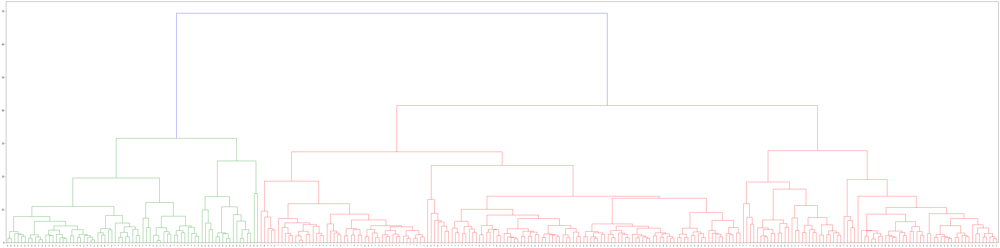

In [ ]:
N = normalized_XRF
Z = linkage(N, 'ward')
fig = plt.figure(figsize=(80, 20))
dn = dendrogram(Z)

plt.show()

Figure 12: Dendrogram of Hierarchical Clustering 

Based on the above complete dendrogram (figure 12), 5 or 6 cluster groups break out similar size populations of like samples.

\

The below dendrogram (figure 13) truncates once 6 clusters are created. The number below the leaves is the total samples that fall within that cluster.

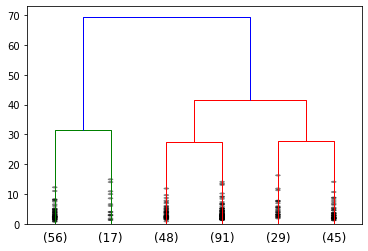

In [ ]:
V = linkage(normalized_XRF, 'ward')

dendrogram(
    V,
    truncate_mode='lastp',
    p=6,
    show_leaf_counts=True,
    leaf_rotation=0.,
    leaf_font_size=12,
    show_contracted=True,
    )
plt.show()

Figure 13: Dendrogram of heirarchical clustering truncating after 6 clusters are reached. Cluster's summation in parentheses

Now to assign each sample to the above cluster groups, the Agglomerative Clustering package from sklearn will be used.   

In [ ]:


hierarc = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
hierarc_clusters = hierarc.fit_predict(normalized_XRF)

In [ ]:
# creating a dataframe for these clusters 
Hierarch = pd.DataFrame(hierarc_clusters, columns=['Hierarch_Cluster_Group'])
Hierarch

Below is a histogram plot (figure 14) of the agglomerative clustering distribution.

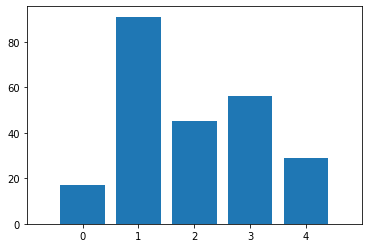

In [ ]:
#Histogram 
bins = np.arange(6) - 0.5
data = Hierarch.Hierarch_Cluster_Group
plt.hist(data, bins, rwidth=0.8)
plt.xticks(range(5))
plt.xlim([-1, 5])

plt.show()

Figure 14: Histogram of agglomerative cluster groups

In [ ]:
# adding the hierarch cluster group to the dataframe
df_XRF2 = pd.concat([df_XRF2, Hierarch],axis=1)
df_XRF2

The below plots (figures 15 and 16) show how the different agglomerative clusters break out in the different elemental relationships

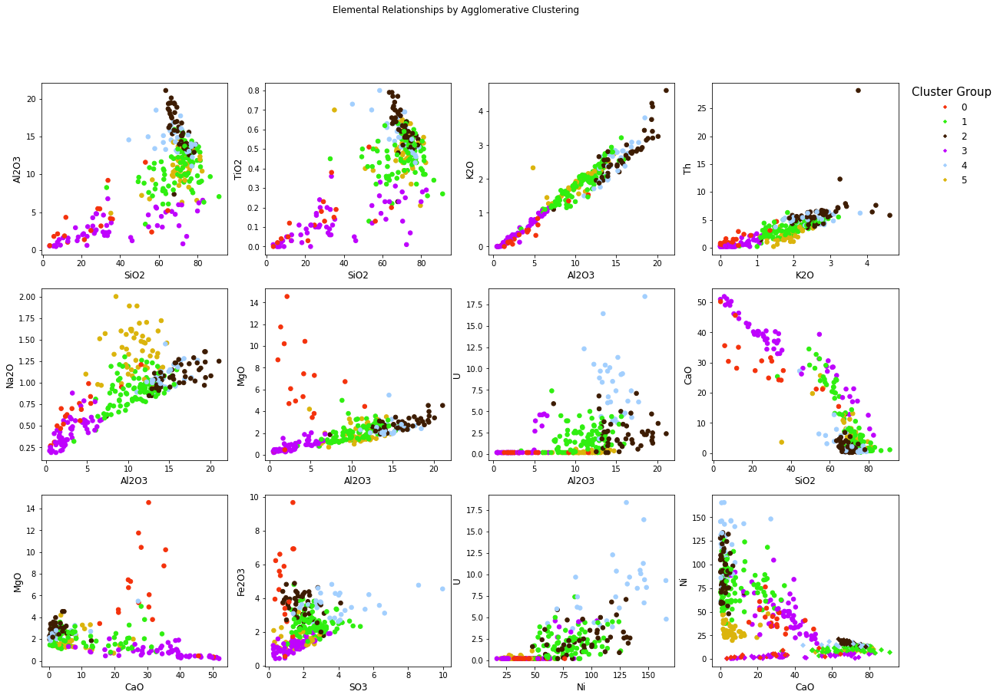

In [ ]:
#@title Elemental Relationships by Agglomerative Clustering Coding

fig, ((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8),(ax9,ax10,ax11,ax12)) = plt.subplots(3,4, figsize=(20,14), )

fig.suptitle('Elemental Relationships by Agglomerative Clustering')

classes = ['0','1','2','3', '4', '5', '6']
values = df_XRF2.Hierarch_Cluster_Group

label = ['0','1','2','3', '4', '5', '6']
colors = ['xkcd:vermillion', 'xkcd:vivid green', 'xkcd:chocolate', 'xkcd:bright purple', 'xkcd:baby blue', 'xkcd:gold']

scatter = plt.scatter(df_XRF2.SiO2, df_XRF2.Al2O3, c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax4.legend(handles=scatter.legend_elements()[0], labels=classes, title='Cluster Group', fontsize='12',title_fontsize='15',bbox_to_anchor=(1.05,1), loc='upper left', borderaxespad=0)



ax1.scatter(df_XRF2.SiO2, df_XRF2.Al2O3, c=values, marker='o', s=30, label=label, cmap=matplotlib.colors.ListedColormap(colors))
ax1.set_ylabel('Al2O3')
ax1.set_xlabel('SiO2')

ax2.scatter(df_XRF2.SiO2, df_XRF2.TiO2, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax2.set_ylabel('TiO2')
ax2.set_xlabel('SiO2')

ax3.scatter(df_XRF2.Al2O3, df_XRF2.K2O, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax3.set_ylabel('K2O')
ax3.set_xlabel('Al2O3')

ax4.scatter(df_XRF2.K2O, df_XRF2.Th, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax4.set_ylabel('Th')
ax4.set_xlabel('K2O')

ax5.scatter(df_XRF2.Al2O3, df_XRF2.Na2O, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax5.set_ylabel('Na2O')
ax5.set_xlabel('Al2O3')

ax6.scatter(df_XRF2.Al2O3, df_XRF2.MgO, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax6.set_ylabel('MgO')
ax6.set_xlabel('Al2O3')

ax7.scatter(df_XRF2.Al2O3, df_XRF2.U, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax7.set_ylabel('U')
ax7.set_xlabel('Al2O3')

ax8.scatter(df_XRF2.SiO2, df_XRF2.CaO, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax8.set_ylabel('CaO')
ax8.set_xlabel('SiO2')

ax9.scatter(df_XRF2.CaO, df_XRF2.MgO, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax9.set_ylabel('MgO')
ax9.set_xlabel('CaO')

ax10.scatter(df_XRF2.SO3, df_XRF2.Fe2O3, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax10.set_ylabel('Fe2O3')
ax10.set_xlabel('SO3')

ax11.scatter(df_XRF2.Ni, df_XRF2.U, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax11.set_ylabel('U')
ax11.set_xlabel('Ni')

ax12.scatter(df_XRF2.CaO, df_XRF2.Ni, c=values, label=label, cmap=matplotlib.colors.ListedColormap(colors), marker='o', s=30)
ax12.set_ylabel('Ni')
ax12.set_xlabel('CaO')

fig.show()

Figure 15: Elemental Relationships by Agglomerative Cluster Groups

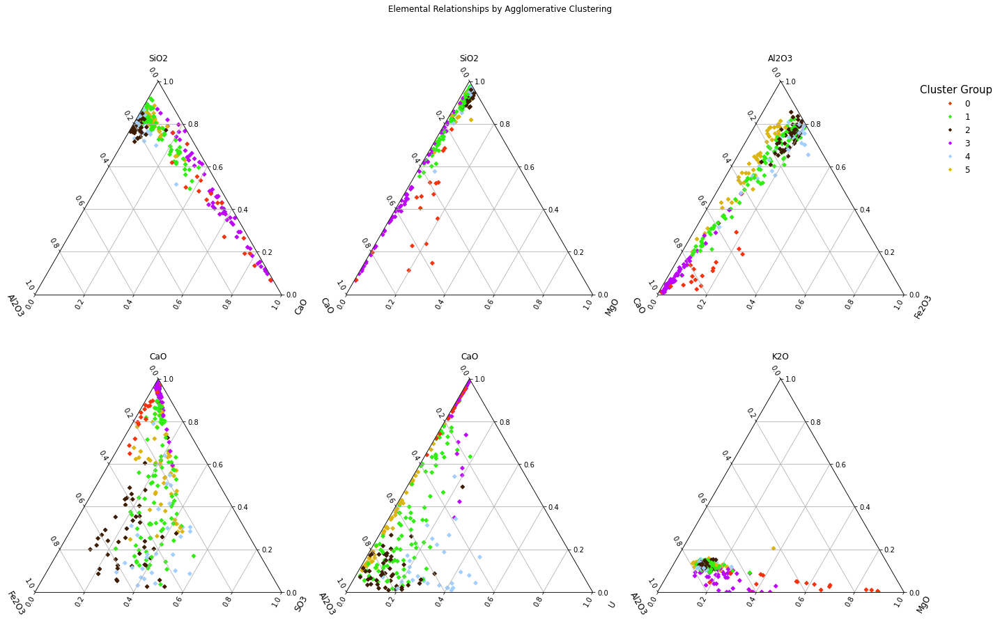

In [ ]:
#@title Elemental Relationships by KMeans Clustering Coding - Ternary Diagrams
fig, ax = plt.subplots(2,3 , sharex=True, sharey=True, figsize=(20,12))

ax1 = df_XRF2.loc[:, ["SiO2", "Al2O3", "CaO"]].pyroplot.scatter(ax=ax[0,0], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax2 = df_XRF2.loc[:, ["SiO2", "CaO", "MgO"]].pyroplot.scatter(ax=ax[0,1], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax3 = df_XRF2.loc[:, ["Al2O3", "CaO", "Fe2O3"]].pyroplot.scatter(ax=ax[0,2], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax4 = df_XRF2.loc[:, ["CaO", "Fe2O3", "SO3"]].pyroplot.scatter(ax=ax[1,0], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax5 = df_XRF2.loc[:, ["CaO", "Al2O3", "U"]].pyroplot.scatter(ax=ax[1,1], c=values, cmap=matplotlib.colors.ListedColormap(colors))
ax6 = df_XRF2.loc[:, ["K2O", "Al2O3", "MgO"]].pyroplot.scatter(ax=ax[1,2], c=values, cmap=matplotlib.colors.ListedColormap(colors))

ax3.legend(handles=scatter.legend_elements()[0], labels=classes, title='Cluster Group', fontsize='12',title_fontsize='15',bbox_to_anchor=(1.05,1), loc='upper left', borderaxespad=0)

ax1.grid(True)
ax2.grid(True)
ax3.grid(True)
ax4.grid(True)
ax5.grid(True)
ax6.grid(True)

fig.suptitle('Elemental Relationships by Agglomerative Clustering', y=1.05)
fig.tight_layout(pad=1)

plt.show()

Figure 16: Elemental Relationships by Agglomerative Cluster Groups

**Interpretation of Agglomerative Cluster Groupings:**


Cluster 0 (Red dots): Represents samples with elevated amounts of dolomite\
Cluster 1 (Green dots): Represents sampels that are mixed mudstones, slightly calcareous and less argillaceous than cluster 2 \
Cluster 2 (Black dots): Represents samples that are clay rich mudstones, more argillaceous than cluster 1 and have lower values of redox sensitive proxy elements\
Cluster 3 (Purple dots): Represent samples that are dominatntly calcareous\
Cluster 4 (Blue dots): Represent samples that are more clay rich and also have elevated values of redox sensitive proxy elements\
Cluster 5 (Gold dots): Represents samples that are mixed mustones, similar to cluster 1, however contains higher Na2O, maybe indicating more plag, and lower values of redox sensitive proxy elements

#Multivariate Linear Regression
The next step in the process is to perform the multivariate linear regression (MVR) modeling. In the following work, all data will be used as a proof of concept to see how well MVR can predict mineralogy from elemental data.

The first step is to drop the summation columns and minerals that have no values from the XRD dataframe. In this case, that includes Kaolinite, Magnesite and Siderite. In the XRF dataframe, Cl was predominately measured at the limit of detection and therefore will be dropped from the modeling.

In [ ]:
multi_lingreg = LinearRegression()
X = df_XRF.drop(['Cl'], axis=1)
#X = X.set_index('Depth')
Y = df_XRD.drop(['Kaolinite','Magnesite', 'Siderite','TECTOSILICATES',	'CARBONATES',	'PHYLLOSILICATES',	'ADDITIONAL'], axis=1)
#Y = Y.set_index('Depth')

In [ ]:
# Here the linear regression code is ran on the two matrices 
multi_lingreg.fit(X,Y)

In [ ]:
# Below are the intercepts for the linear regression equation. There is an intercept for each mineral to be predicted.
multi_lingreg.intercept_

In [ ]:
# Below are the coefficents for each element. Each mineral to be predicted has a coefficent for each element
multi_lingreg.coef_

After running the analysis, a dataframe is created where the index are the different minerals and the colummns are each elements coefficent to calculate that mineral.

In [ ]:
coef_df = pd.DataFrame(data = multi_lingreg.coef_,
                       index = ['Quartz_Coef', 'Kspar_Coef',	'Plagioclase_Coef', 'Calcite_Coef',	'Dolomite_Coef', 'Chlorite_Coef', 'I-M_Coef', 'I-S_Coef',	'Pyrite_Coef', 'Apatite_Coef'],
                       columns = ['SiO2','TiO2','Al2O3','Fe2O3','MnO','MgO','CaO','Na2O','K2O','P2O5','SO3','V','Cr','Co','Ni','Cu','Zn','Ga','As','Br','Rb','Sr','Y','Zr','Nb','Mo','Ba','Hf','Pb','Th','U']
                       ) 

#The coefficent dataframe needs to be transposed for the next set of calculations
coef_df = coef_df.transpose()

coef_df

,Quartz_Coef,Kspar_Coef,Plagioclase_Coef,Calcite_Coef,Dolomite_Coef,Chlorite_Coef,I-M_Coef,I-S_Coef,Pyrite_Coef,Apatite_Coef
SiO2,0.509026,-0.018299,-0.046733,-0.272438,0.027122,0.008285,-0.194915,0.002482,-0.017566,0.004015
TiO2,11.337447,-7.359438,2.975783,28.990933,-28.690648,5.947546,-7.432818,-5.218068,0.449279,-0.760243
Al2O3,-1.429333,-0.253073,-0.108275,0.015783,0.269189,0.037501,1.307480,0.089540,0.039330,0.028724
Fe2O3,-0.434030,0.085886,-0.011072,-1.303665,2.036901,0.694727,-1.011467,-0.166772,0.037112,0.072233
MnO,-7.800585,-1.635331,-2.266432,-8.224749,22.820143,-6.632691,2.945002,-0.562722,1.104413,0.441573
MgO,-0.893660,-0.171155,-0.201073,-4.275503,5.786905,-0.263434,0.099232,0.048053,-0.100959,-0.028406
CaO,-0.758921,-0.073319,-0.132625,1.265994,0.083853,-0.022923,-0.319675,-0.005345,-0.036866,0.005697
Na2O,-3.533854,2.885045,6.845712,-2.676998,4.184489,0.240935,-7.710550,0.198056,-0.326781,-0.176200
K2O,1.253615,2.450511,0.031258,4.173331,-1.441603,-2.571925,-1.863376,-1.153621,-0.470980,-0.305408
P2O5,-1.932290,0.021484,0.178739,-2.317657,1.132254,0.154369,0.398828,-0.383910,-0.708934,3.441588


In [ ]:
# A dataframe was also created for the intercept. The dataframe needs to be transposed for the next set of calculations

intercept = pd.DataFrame(multi_lingreg.intercept_,
                         columns=['intcp'])
interceptT = intercept.transpose()
interceptT



,0,1,2,3,4,5,6,7,8,9
intcp,45.336003,2.955154,5.659921,29.859222,-6.495664,1.0656,20.158948,0.228412,1.812172,-0.356945


Next we need to multiply the original XRF data with the coefficent dataframe and then add the intercept which gets us to the calcuated mineralogy.

In [ ]:
# Performing Multivariate Regression Analysis and adding on intercept

print(X.shape)
print(coef_df.shape)


MinCalc = X.dot(coef_df)

MinCalc = MinCalc + interceptT.values

MinCalc.columns = ['Quartz_calc', 'Kspar_calc', 'Plag_calc', 'Calcite_calc', 'Dolomtie_calc', 'Chlorite_calc', 'I_M_calc', 'I_S_calc', 'Pyrite_calc', 'Apatite_calc']
MinCalc['Total_Clay_calc'] = MinCalc.iloc[: , 5:8].sum(axis=1)

MinCalc



In [ ]:
# For ease of plotting and statistics, the XRD data is merged with the calculated mineralogy into one dataframe
MinCompare=pd.concat([Y, MinCalc], axis=1).reindex(Y.index)
MinCompare['Total_Clay'] = MinCompare.iloc[: , 5:8].sum(axis=1) #sum of the measured clay is calculated here
MinCompare



,Quartz,Kspar,Plagioclase,Calcite,Dolomite,Chlorite,I_M,I_S,Pyrite,Apatite,Quartz_calc,Kspar_calc,Plag_calc,Calcite_calc,Dolomtie_calc,Chlorite_calc,I_M_calc,I_S_calc,Pyrite_calc,Apatite_calc,Total_Clay_calc,Total_Clay
Depth,,,,,,,,,,,,,,,,,,,,,,
9355.97,53.5,4.4,12.3,0.1,8.2,0.0,20.3,0.1,1.3,0.1,54.686740,5.637527,12.928778,-0.766047,7.741884,0.856896,18.167297,0.280682,0.849322,-0.165158,19.304874,20.4
9365.03,59.9,6.0,13.4,1.6,3.7,0.0,15.4,0.1,0.1,0.1,61.149981,6.800070,14.101630,0.587697,2.856015,1.093186,12.687356,1.204299,-0.285132,0.010216,14.984841,15.5
9374.97,56.9,5.8,11.9,5.0,12.9,0.0,7.5,0.1,0.1,0.1,55.677703,5.522599,11.564018,5.603301,13.139564,0.292167,8.496221,-0.082575,-0.137006,0.185831,8.705812,7.6
9385.00,64.4,7.7,10.9,2.7,9.5,0.0,4.8,0.1,0.1,0.0,66.787000,6.226334,10.869220,3.032893,5.817847,-0.130311,7.097589,-0.384643,0.658457,0.263619,6.582635,4.9
9395.01,55.2,5.5,11.9,12.8,3.4,0.0,9.7,0.1,1.5,0.0,56.060645,5.648298,11.873108,8.635351,4.996122,-0.365792,12.183666,-0.090099,1.463899,-0.247033,11.727775,9.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13233.95,48.1,0.1,5.4,8.6,4.8,4.4,25.1,1.7,1.9,0.1,49.328250,0.251715,5.961858,6.938477,5.538247,3.028255,26.131455,0.689460,2.171533,0.105892,29.849169,31.2
13247.03,45.5,0.1,6.0,12.8,2.5,4.4,22.4,4.0,2.4,0.1,48.845094,-0.431751,7.197009,10.253018,4.473297,4.466759,22.295097,0.747229,2.045937,0.220789,27.509085,30.8
13259.95,61.4,1.3,5.7,4.5,4.0,5.2,15.6,1.0,1.3,0.1,61.787902,0.774797,5.777772,1.805138,5.555023,4.146162,17.841626,1.028322,1.311481,0.120857,23.016111,21.8


In [ ]:
#A Pearson Correlation coefficient and p-value are calculated for each mineral

from scipy import stats
from scipy.stats import pearsonr

qtz_pcc,qtz_pv = pearsonr(MinCompare.Quartz, MinCompare.Quartz_calc)
cal_pcc,cal_pv = pearsonr(MinCompare.Calcite, MinCompare.Calcite_calc)
dol_pcc,dol_pv = pearsonr(MinCompare.Dolomite, MinCompare.Dolomtie_calc)
plag_pcc,plag_pv = pearsonr(MinCompare.Plagioclase, MinCompare.Plag_calc)
kspar_pcc,kspar_pv = pearsonr(MinCompare.Kspar, MinCompare.Kspar_calc)
totcl_pcc,totcl_pv = pearsonr(MinCompare.Total_Clay, MinCompare.Total_Clay_calc)
ill_m_pcc,ill_m_pv = pearsonr(MinCompare.I_M, MinCompare.I_M_calc)
ill_s_pcc,ill_s_pv = pearsonr(MinCompare.I_S, MinCompare.I_S_calc)
pyr_pcc,pyr_pv = pearsonr(MinCompare.Pyrite, MinCompare.Pyrite_calc)
apa_pcc,apa_pv = pearsonr(MinCompare.Apatite, MinCompare.Apatite_calc)

The below set of plots (Figure 17) compare the XRD mineralogy and the calculated mineralogy. A 1-to-1 line is added to each plot and the pearson correlation coefficient is included as well. 

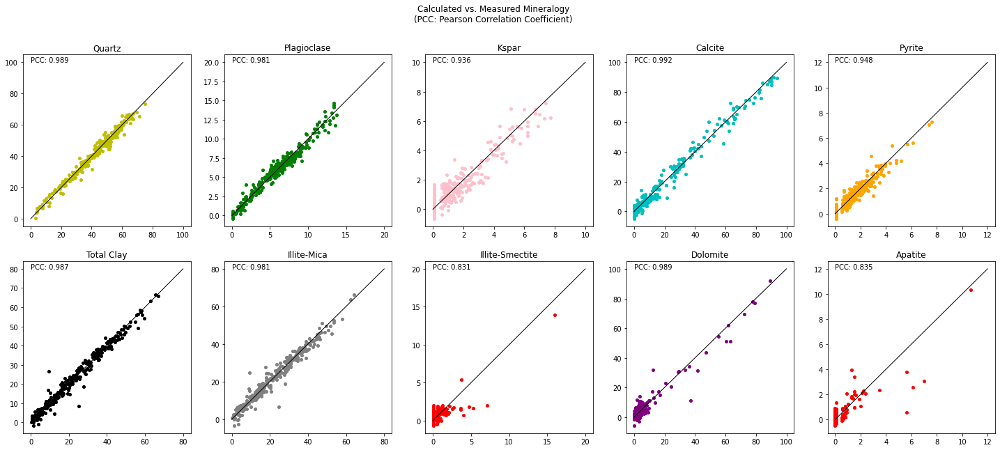

In [ ]:
#@title Calculated vs Measured Mineralogy Plots Coding
fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10)) = plt.subplots(2,5, figsize=(25,10))

fig.suptitle('Calculated vs. Measured Mineralogy\n(PCC: Pearson Correlation Coefficient)')

ax1.scatter(MinCompare.Quartz, MinCompare.Quartz_calc, c='y', marker='o')
ax1.set_title('Quartz')
ax1.plot([0,100],[0,100],'k-')
#qtzPrsn = stats.pearsonr(MinCompare.Quartz, MinCompare.Quartz_calc)
ax1.text(0,100, ("PCC: "'{:0.3f}'.format(qtz_pcc)))
#ax1.text(0,95, ("P-Val: "'{:0.3e}'.format(qtz_pv)))

ax2.scatter(MinCompare.Plagioclase, MinCompare.Plag_calc, c='g', marker='o')
ax2.set_title('Plagioclase')
ax2.plot([0,20],[0,20],'k-')
ax2.text(0,20, ("PCC: "'{:0.3f}'.format(plag_pcc)))
#ax2.text(0,19, ("P-Val: "'{:0.3e}'.format(plag_pv)))

ax3.scatter(MinCompare.Kspar, MinCompare.Kspar_calc, c='pink', marker='o')
ax3.set_title('Kspar')
ax3.plot([0,10],[0,10],'k-')
ax3.text(0,10, ("PCC: "'{:0.3f}'.format(kspar_pcc)))
#ax3.text(0,9.5, ("P-Val: "'{:0.3e}'.format(kspar_pv)))

ax4.scatter(MinCompare.Calcite, MinCompare.Calcite_calc, c='c', marker='o')
ax4.set_title('Calcite')
ax4.plot([0,100],[0,100],'k-')
ax4.text(0,100, ("PCC: "'{:0.3f}'.format(cal_pcc)))
#ax4.text(0,95, ("P-Val: "'{:0.3e}'.format(cal_pv)))

ax5.scatter(MinCompare.Pyrite, MinCompare.Pyrite_calc, c='orange', marker='o')
ax5.set_title('Pyrite')
ax5.plot([0,12],[0,12],'k-')
ax5.text(0,12, ("PCC: "'{:0.3f}'.format(pyr_pcc)))
#ax5.text(0,11.5, ("P-Val: "'{:0.3e}'.format(pyr_pv)))

ax6.scatter(MinCompare.Total_Clay, MinCompare.Total_Clay_calc, c='black', marker='o')
ax6.set_title('Total Clay')
ax6.plot([0,80],[0,80],'k-')
ax6.text(0,80, ("PCC: "'{:0.3f}'.format(totcl_pcc)))
#ax6.text(0,75, ("P-Val: "'{:0.3e}'.format(totcl_pv)))

ax7.scatter(MinCompare.I_M, MinCompare.I_M_calc, c='gray', marker='o')
ax7.set_title('Illite-Mica')
ax7.plot([0,80],[0,80],'k-')
ax7.text(0,80, ("PCC: "'{:0.3f}'.format(ill_m_pcc)))
#ax7.text(0,75, ("P-Val: "'{:0.3e}'.format(ill_m_pv)))

ax8.scatter(MinCompare.I_S, MinCompare.I_S_calc, c='red', marker='o')
ax8.set_title('Illite-Smectite')
ax8.plot([0,20],[0,20],'k-')
ax8.text(0,20, ("PCC: "'{:0.3f}'.format(ill_s_pcc)))
#ax8.text(0,19, ("P-Val: "'{:0.3e}'.format(ill_s_pv)))

ax9.scatter(MinCompare.Dolomite, MinCompare.Dolomtie_calc, c='purple', marker='o')
ax9.set_title('Dolomite')
ax9.plot([0,100],[0,100],'k-')
ax9.text(0,100, ("PCC: "'{:0.3f}'.format(qtz_pcc)))
#ax9.text(0,95, ("P-Val: "'{:0.3e}'.format(qtz_pv)))

ax10.scatter(MinCompare.Apatite, MinCompare.Apatite_calc, c='red', marker='o')
ax10.set_title('Apatite')
ax10.plot([0,12],[0,12],'k-')
ax10.text(0,12, ("PCC: "'{:0.3f}'.format(apa_pcc)))
#ax10.text(0,11.5, ("P-Val: "'{:0.3e}'.format(apa_pv)))



fig.show()

Figure 17: Calculated vs Measured Mineralogy 

Overall the correlation is very strong. Eight of the 11 mineral's pearson correlation coefficents (PCC) are 0.94 or better. Illite/Smectite and Apatite had the lowest PCC of 0.831 and 0.834 respectively.  

The Mean Squared Error measures the average of the squared difference between the actual values (XRD data) and the predicted values (calcualted mineralogy). For the MVR modeling using the entire data set, the MSE is **3.618**

In [ ]:
from sklearn.metrics import mean_squared_error
MinCalc_c = MinCalc.drop('Total_Clay_calc', axis=1)
mean_squared_error(Y, MinCalc_c)

3.6175992732992457

#Training and Testing Data Set
Now that we know the MVR modeling passes the proof of concept, the next step is to create a random training and testing subset of the data. Different proportions of the training and testing will be performed, and each proportion will be tested 5 times. The resulting mean squared error will be used to evaluate how the model performed compared to when the full data set was used.

In [ ]:
from sklearn.model_selection import train_test_split # package used to make the split

In [ ]:
#resetting the XRF dataframe and adding the cluster group into the table temporarily
X = df_XRF
X = X.reset_index()
X = X.drop(['Cl'], axis=1)
X = pd.concat([X, clustergroup],axis=1)
X = pd.concat([X, Hierarch],axis=1)

X

,Depth,SiO2,TiO2,Al2O3,Fe2O3,MnO,MgO,CaO,Na2O,K2O,P2O5,SO3,V,Cr,Co,Ni,Cu,Zn,Ga,As,Br,Rb,Sr,Y,Zr,Nb,Mo,Ba,Hf,Pb,Th,U,KM_Cluster_Group,Hierarch_Cluster_Group
0,9355.97,69.95,0.64,13.66,1.93,0.03,2.44,3.26,1.60,2.36,0.11,1.79,50.0,100.0,8.8,30.2,26.7,17.4,10.6,4.1,1.4,56.3,103.5,20.4,351.1,13.1,10.4,278.0,10.7,5.2,4.0,0.2,1,5
1,9365.03,74.77,0.58,12.26,0.99,0.02,1.38,2.72,1.70,2.12,0.16,0.65,41.5,162.5,1.5,23.0,21.9,16.0,9.9,1.9,1.0,49.9,113.0,20.2,401.0,12.1,12.0,322.3,11.2,5.4,4.8,0.3,1,5
2,9374.97,71.13,0.39,9.15,2.08,0.06,2.32,8.16,1.60,1.66,0.13,0.29,15.2,132.7,1.5,22.9,5.4,7.6,5.7,2.5,0.7,41.3,168.8,16.2,233.6,7.6,11.4,408.8,3.8,4.2,2.1,0.2,1,5
3,9385.00,79.62,0.21,6.55,1.38,0.03,1.19,3.80,1.51,1.45,0.08,0.98,9.1,71.1,5.6,23.2,6.1,31.7,4.7,4.4,0.6,35.3,115.7,8.9,133.2,5.9,13.2,513.8,1.0,9.0,0.2,0.2,1,5
4,9395.01,70.53,0.43,9.78,1.66,0.03,1.32,7.23,1.56,1.81,0.09,2.55,22.8,135.3,1.5,31.7,8.6,7.2,9.1,3.6,0.7,44.3,196.3,15.9,253.2,9.6,10.8,412.1,3.0,10.4,2.1,0.2,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,13233.95,73.24,0.48,11.48,3.19,0.02,2.59,5.91,0.89,1.68,0.11,2.51,75.8,81.2,7.1,94.9,28.0,117.0,10.5,4.5,0.4,59.9,209.1,20.4,87.1,9.5,7.7,194.1,1.0,15.5,4.0,1.0,1,1
282,13247.03,71.18,0.59,11.54,3.55,0.02,2.55,7.15,0.98,1.47,0.22,2.50,84.0,80.3,2.2,82.3,32.1,125.0,11.3,3.4,0.6,54.9,292.3,27.5,107.7,9.7,7.1,216.0,1.6,16.8,4.6,0.6,1,1
283,13259.95,81.20,0.37,8.95,2.58,0.01,2.04,3.36,0.79,1.15,0.10,1.74,62.0,72.2,11.2,82.4,35.3,272.6,11.1,3.8,0.4,44.6,159.3,14.7,71.0,7.1,8.3,193.5,1.0,11.1,3.1,1.2,1,1
284,13277.03,56.32,0.13,2.37,3.78,0.05,4.71,21.17,0.61,0.07,0.07,1.17,17.4,86.4,1.5,52.3,10.2,40.4,1.7,1.5,1.2,7.6,568.1,13.6,45.8,4.5,10.9,164.3,1.0,2.8,0.5,0.2,4,0


In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X, Y, train_size=.5)  #train size sets the % of trained data

In [ ]:
print(X_train.shape,X_test.shape,Y_train.shape, Y_test.shape)

(143, 34) (143, 34) (143, 10) (143, 10)


The below histograms (figure 18) compare the distribution of the training dataset with the complete distribrution. I felt it would be important to observe how well the model performed when the relative distribution of the training data set was similar or significanlty different with that of the overall distribution. 

Observation: The higher the percentage the training dataset was, the more closely it's distribution compared to the overall distribution. 

In the future, it would be nice to have a quantitative way to compare how closely the training subset distribution matches proportionally to the original distribution and then tie that in with the MSE.

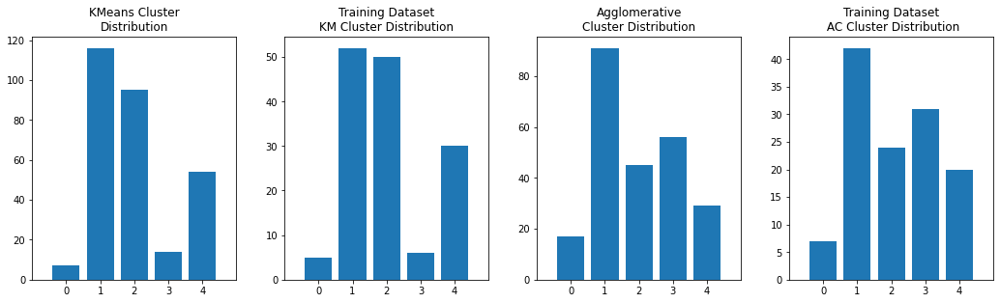

In [ ]:
#@title Training Dataset Histogram Compared to Full Dataset Coding
## Add Histogram of cluster group distribution for the X_train data set to ensure reasonable coverage...

km_hist = kmeans.labels_
km_trainhist = X_train.KM_Cluster_Group
AC_hist = Hierarch.Hierarch_Cluster_Group
AC_trainhist = X_train.Hierarch_Cluster_Group

bins = np.arange(6) - 0.5

plt.figure(figsize=(15,5))

plt.subplot(1,4,1)
plt.hist(km_hist, bins, rwidth=0.8)
plt.xticks(range(5))
plt.xlim([-1, 5])
plt.title('KMeans Cluster\nDistribution')

plt.subplot(1,4,2)
plt.hist(km_trainhist, bins, rwidth=0.8)
plt.xticks(range(5))
plt.xlim([-1, 5])
plt.title('Training Dataset\nKM Cluster Distribution')


plt.subplot(1,4,3)
plt.hist(AC_hist, bins, rwidth=0.8)
plt.xticks(range(5))
plt.xlim([-1, 5])
plt.title('Agglomerative\nCluster Distribution')

plt.subplot(1,4,4)
plt.hist(AC_trainhist, bins, rwidth=0.8)
plt.xticks(range(5))
plt.xlim([-1, 5])
plt.title('Training Dataset\n AC Cluster Distribution')


#plt.show()


plt.tight_layout(pad=3)

Figure 18: Training dataset KMeans Cluster Group and Agglomerative Cluster Group histograms compared to the full dataset histograms

In [ ]:
## drop cluster group column from X_train and X_test
X_train = X_train.drop(['KM_Cluster_Group','Hierarch_Cluster_Group'] , axis=1)
X_train = X_train.set_index('Depth')
X_test = X_test.drop(['KM_Cluster_Group','Hierarch_Cluster_Group'], axis=1)
X_test = X_test.set_index('Depth')

In [ ]:
multi_linreg_2 = LinearRegression()

In [ ]:
X_train.head()

In [ ]:
Y_train.head()

The same steps are taken in the following workflow with the training XRF and XRD data sets to get to the mineral calcualtion as in the previous section.

In [ ]:
multi_linreg_2.fit(X_train, Y_train)

In [ ]:
multi_linreg_2.intercept_

In [ ]:
multi_linreg_2.coef_

In [ ]:
coef_df_2 = pd.DataFrame(data = multi_linreg_2.coef_,
                       index = ['Quartz_Coef', 'Kspar_Coef',	'Plagiolcase_Coef', 'Calcite_Coef',	'Dolomite_Coef', 'Chlorite_Coef', 'I-M_Coef', 'I-S_Coef',	'Pyrite_Coef', 'Apatite_Coef'],
                       columns = ['SiO2','TiO2','Al2O3','Fe2O3','MnO','MgO','CaO','Na2O','K2O','P2O5','SO3','V','Cr','Co','Ni','Cu','Zn','Ga','As','Br','Rb','Sr','Y','Zr','Nb','Mo','Ba','Hf','Pb','Th','U']
                       ) 

coef_df_2 = coef_df_2.transpose()

coef_df_2

,Quartz_Coef,Kspar_Coef,Plagiolcase_Coef,Calcite_Coef,Dolomite_Coef,Chlorite_Coef,I-M_Coef,I-S_Coef,Pyrite_Coef,Apatite_Coef
SiO2,0.444535,-0.032283,-0.056746,-0.181793,-0.012590,-0.003822,-0.148285,0.004259,-0.012573,0.000972
TiO2,11.000704,-4.421161,7.128826,33.316029,-29.637951,11.569461,-21.940115,-5.551837,-0.840968,-0.622640
Al2O3,-1.232621,-0.680262,-0.334308,0.291838,-0.524289,-0.093609,2.257181,0.174884,0.100911,0.041988
Fe2O3,-0.998009,0.152291,-0.227902,-0.380945,2.481578,0.764953,-1.657758,-0.195900,0.066639,0.017465
MnO,-10.993131,-2.094004,-1.005383,7.510249,14.021361,-2.858604,-5.825635,0.206985,0.339012,0.848741
MgO,-0.817582,-0.200858,-0.155010,-5.299486,5.747640,-0.437193,1.200979,0.017234,-0.051731,-0.015088
CaO,-0.865828,-0.096502,-0.150343,1.425342,-0.022177,-0.042343,-0.231269,-0.005738,-0.017588,0.012614
Na2O,-3.481504,2.972514,6.853702,-4.202950,4.068627,0.001936,-6.615411,0.354496,-0.439089,0.435669
K2O,-4.695655,3.540068,0.639648,4.475802,4.806245,-3.748215,-3.168328,-1.124978,-0.788810,0.201355
P2O5,-0.683580,-0.061840,-0.021226,-2.166904,0.765246,0.164175,0.028942,-0.444636,-0.697520,3.104560


In [ ]:
intercept_2 = pd.DataFrame(multi_linreg_2.intercept_,
                         columns=['intcp'])
interceptT_2 = intercept.transpose()
interceptT_2



,0,1,2,3,4,5,6,7,8,9
intcp,45.336003,2.955154,5.659921,29.859222,-6.495664,1.0656,20.158948,0.228412,1.812172,-0.356945


In [ ]:
print(X_test.shape)
print(coef_df_2.shape)


MinCalc_2 = X_test.dot(coef_df_2)

MinCalc_2 = MinCalc_2 + interceptT_2.values

MinCalc_2.columns = ['Quartz_calc', 'Kspar_calc', 'Plag_calc', 'Calcite_calc', 'Dolomtie_calc', 'Chlorite_calc', 'I_M_calc', 'I_S_calc', 'Pyrite_calc', 'Apatite_calc']
MinCalc_2['Total_Clay_calc'] = MinCalc_2.iloc[: , 5:8].sum(axis=1)

MinCalc_2

In [ ]:
MinCompare_2=pd.concat([Y_test, MinCalc_2], axis=1).reindex(Y_test.index)
MinCompare_2['Total_Clay'] = MinCompare_2.iloc[: , 5:8].sum(axis=1)
MinCompare_2

,Quartz,Kspar,Plagioclase,Calcite,Dolomite,Chlorite,I_M,I_S,Pyrite,Apatite,Quartz_calc,Kspar_calc,Plag_calc,Calcite_calc,Dolomtie_calc,Chlorite_calc,I_M_calc,I_S_calc,Pyrite_calc,Apatite_calc,Total_Clay_calc,Total_Clay
Depth,,,,,,,,,,,,,,,,,,,,,,
12230.02,16.3,1.7,5.7,5.6,2.9,1.8,62.5,2.5,1.0,0.1,8.801155,0.639270,3.435536,8.169132,5.922078,-1.631515,71.359748,1.180397,2.555147,-0.217335,70.908630,66.8
12501.97,44.4,1.5,5.6,0.0,4.8,2.6,38.3,0.9,1.9,0.0,39.854923,0.576681,4.694193,10.450519,-3.887751,2.174024,42.050534,1.240634,2.741576,0.328391,45.465191,41.8
10195.99,57.2,5.2,10.8,2.8,8.5,0.1,15.5,0.1,0.1,0.1,44.368555,4.263114,9.830838,12.990930,10.061043,-0.234055,18.444992,0.507378,0.354580,-0.169441,18.718315,15.7
10849.95,63.0,0.1,3.6,15.1,2.5,0.0,13.6,0.1,2.2,0.1,61.463416,-1.176848,1.659288,20.356189,-3.531040,-0.904625,19.199095,0.395199,2.381054,0.444180,18.689669,13.7
12777.52,37.3,0.6,5.2,0.1,0.1,2.7,44.9,7.1,2.2,0.1,36.417467,-0.478272,5.710561,9.922573,-12.883179,3.751802,53.240553,1.450311,2.957715,0.085934,58.442666,54.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12344.48,35.2,1.0,4.4,39.6,5.7,0.1,13.3,0.1,0.8,0.1,28.832396,-1.522413,3.172381,52.379262,-2.576143,-0.293907,17.927379,0.245013,1.720688,0.467719,17.878486,13.5
10908.99,63.7,1.9,8.7,1.2,2.7,0.0,20.2,0.1,1.6,0.0,60.950422,0.753913,7.784669,7.675299,-5.300347,-0.653983,25.843918,0.220790,2.596446,0.263668,25.410726,20.3
13019.46,36.8,0.1,8.9,4.3,6.2,5.0,35.2,1.5,2.1,0.1,33.900006,-0.578699,6.434455,9.197157,-1.582904,3.171582,44.772684,1.429248,3.075251,0.328412,49.373514,41.7


In [ ]:
qtz2_pcc,qtz2_pv = pearsonr(MinCompare_2.Quartz, MinCompare_2.Quartz_calc)
cal2_pcc,cal2_pv = pearsonr(MinCompare_2.Calcite, MinCompare_2.Calcite_calc)
dol2_pcc,dol2_pv = pearsonr(MinCompare_2.Dolomite, MinCompare_2.Dolomtie_calc)
plag2_pcc,plag2_pv = pearsonr(MinCompare_2.Plagioclase, MinCompare_2.Plag_calc)
kspar2_pcc,kspar2_pv = pearsonr(MinCompare_2.Kspar, MinCompare_2.Kspar_calc)
totcl2_pcc,totcl2_pv = pearsonr(MinCompare_2.Total_Clay, MinCompare_2.Total_Clay_calc)
ill_m2_pcc,ill_m2_pv = pearsonr(MinCompare_2.I_M, MinCompare_2.I_M_calc)
ill_s2_pcc,ill_s2_pv = pearsonr(MinCompare_2.I_S, MinCompare_2.I_S_calc)
pyr2_pcc,pyr2_pv = pearsonr(MinCompare_2.Pyrite, MinCompare_2.Pyrite_calc)
apa2_pcc,apa2_pv = pearsonr(MinCompare_2.Apatite, MinCompare_2.Apatite_calc)


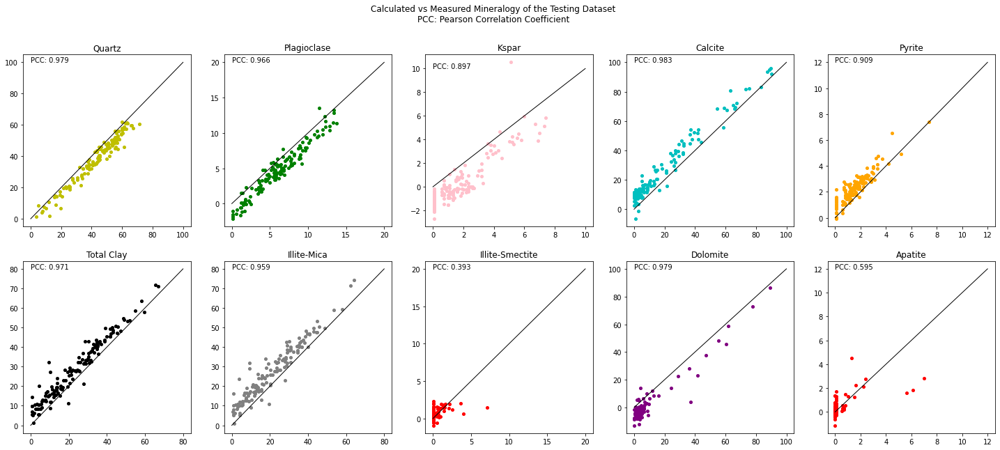

In [ ]:
#@title Calculated vs Measured Mineralogy of the Testing Dataset Coding
fig, ((ax1,ax2,ax3,ax4,ax5),(ax6,ax7,ax8,ax9,ax10)) = plt.subplots(2,5, figsize=(25,10))

fig.suptitle('Calculated vs Measured Mineralogy of the Testing Dataset\nPCC: Pearson Correlation Coefficient')

ax1.scatter(MinCompare_2.Quartz, MinCompare_2.Quartz_calc, c='y', marker='o')
ax1.set_title('Quartz')
ax1.plot([0,100],[0,100],'k-')

ax1.text(0,100, ("PCC: "'{:0.3f}'.format(qtz2_pcc)))
#ax1.text(0,95, ("P-Val: "'{:0.3e}'.format(qtz2_pv)))

ax2.scatter(MinCompare_2.Plagioclase, MinCompare_2.Plag_calc, c='g', marker='o')
ax2.set_title('Plagioclase')
ax2.plot([0,20],[0,20],'k-')
ax2.text(0,20, ("PCC: "'{:0.3f}'.format(plag2_pcc)))
#ax2.text(0,19, ("P-Val: "'{:0.3e}'.format(plag2_pv)))

ax3.scatter(MinCompare_2.Kspar, MinCompare_2.Kspar_calc, c='pink', marker='o')
ax3.set_title('Kspar')
ax3.plot([0,10],[0,10],'k-')
ax3.text(0,10, ("PCC: "'{:0.3f}'.format(kspar2_pcc)))
#ax3.text(0,9.5, ("P-Val: "'{:0.3e}'.format(kspar2_pv)))

ax4.scatter(MinCompare_2.Calcite, MinCompare_2.Calcite_calc, c='c', marker='o')
ax4.set_title('Calcite')
ax4.plot([0,100],[0,100],'k-')
ax4.text(0,100, ("PCC: "'{:0.3f}'.format(cal2_pcc)))
#ax4.text(0,95, ("P-Val: "'{:0.3e}'.format(cal2_pv)))

ax5.scatter(MinCompare_2.Pyrite, MinCompare_2.Pyrite_calc, c='orange', marker='o')
ax5.set_title('Pyrite')
ax5.plot([0,12],[0,12],'k-')
ax5.text(0,12, ("PCC: "'{:0.3f}'.format(pyr2_pcc)))
#ax5.text(0,11.5, ("P-Val: "'{:0.3e}'.format(pyr2_pv)))

ax6.scatter(MinCompare_2.Total_Clay, MinCompare_2.Total_Clay_calc, c='black', marker='o')
ax6.set_title('Total Clay')
ax6.plot([0,80],[0,80],'k-')
ax6.text(0,80, ("PCC: "'{:0.3f}'.format(totcl2_pcc)))
#ax6.text(0,75, ("P-Val: "'{:0.3e}'.format(totcl2_pv)))

ax7.scatter(MinCompare_2.I_M, MinCompare_2.I_M_calc, c='gray', marker='o')
ax7.set_title('Illite-Mica')
ax7.plot([0,80],[0,80],'k-')
ax7.text(0,80, ("PCC: "'{:0.3f}'.format(ill_m2_pcc)))
#ax7.text(0,75, ("P-Val: "'{:0.3e}'.format(ill_m2_pv)))

ax8.scatter(MinCompare_2.I_S, MinCompare_2.I_S_calc, c='red', marker='o')
ax8.set_title('Illite-Smectite')
ax8.plot([0,20],[0,20],'k-')
ax8.text(0,20, ("PCC: "'{:0.3f}'.format(ill_s2_pcc)))
#ax8.text(0,19, ("P-Val: "'{:0.3e}'.format(ill_s2_pv)))

ax9.scatter(MinCompare_2.Dolomite, MinCompare_2.Dolomtie_calc, c='purple', marker='o')
ax9.set_title('Dolomite')
ax9.plot([0,100],[0,100],'k-')
ax9.text(0,100, ("PCC: "'{:0.3f}'.format(qtz2_pcc)))
#ax9.text(0,95, ("P-Val: "'{:0.3e}'.format(qtz2_pv)))

ax10.scatter(MinCompare_2.Apatite, MinCompare_2.Apatite_calc, c='red', marker='o')
ax10.set_title('Apatite')
ax10.plot([0,12],[0,12],'k-')
ax10.text(0,12, ("PCC: "'{:0.3f}'.format(apa2_pcc)))
#ax10.text(0,11.5, ("P-Val: "'{:0.3e}'.format(apa2_pv)))


fig.show()

Figure 19: Calculated vs Measured mineralogy comparison of the testing dataset

The mean squared error was calcualted and recorded for each percentage of training set. Each percentage of training set was analyzed 5 times.

In [ ]:
MinCalc_2 = MinCalc_2.drop('Total_Clay_calc', axis=1)
mean_squared_error(Y_test, MinCalc_2)



23.59055251942386

In [ ]:
#@title Mean Square Error Data
MSE_Test = {'Training_set_pct':['10','20','30','40','50','60','70','80','90'],
            '1':['623.385','96.404','31.866','41.032','25.978','6.417','25.539','8.273','6.906'],
            '2':['1312.174','37.763','24.071','23.105','25.534','24.460','9.218','7.164','6.042'],
            '3':['7486.726','110.399','24.307','26.754','20.200','33.207','9.723','5.799','10.840'],
            '4':['654.537','135.556','29.982','36.812','25.131','7.071','7.163','7.696','7.558'],
            '5':['1938.061','44.372','40.276','42.320','24.004','19.769','14.450','4.705','6.709']
            }

MSE_Test = pd.DataFrame(MSE_Test)
MSE_Test = MSE_Test.apply(pd.to_numeric)
MSE_Test = MSE_Test.set_index('Training_set_pct')
MSE_Test['Avg_MSE'] = MSE_Test.mean(axis=1)
MSE_Test

,1,2,3,4,5,Avg_MSE
Training_set_pct,,,,,,
10,623.385,1312.174,7486.726,654.537,1938.061,2402.9766
20,96.404,37.763,110.399,135.556,44.372,84.8988
30,31.866,24.071,24.307,29.982,40.276,30.1004
40,41.032,23.105,26.754,36.812,42.320,34.0046
50,25.978,25.534,20.200,25.131,24.004,24.1694
60,6.417,24.460,33.207,7.071,19.769,18.1848
70,25.539,9.218,9.723,7.163,14.450,13.2186
80,8.273,7.164,5.799,7.696,4.705,6.7274
90,6.906,6.042,10.840,7.558,6.709,7.6110


Figure 20: Mean Square Error for different percentages of the training dataset

The MSE when all the data (100%) was used to predict mineralogy was **3.618** 

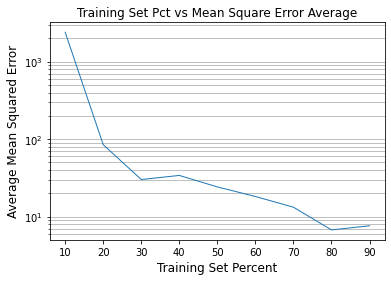

In [ ]:
#@title Training Set Pct vs MSE
plt.plot(MSE_Test.index.values, MSE_Test.Avg_MSE)
plt.xlabel('Training Set Percent')
plt.ylabel('Average Mean Squared Error')
plt.yscale('log')
plt.grid(True, which='both', axis='y')
plt.title('Training Set Pct vs Mean Square Error Average')
plt.show()

Figure 21: Percent of training dataset vs Average Mean Squared Error

#**Discussion**
Through the process, we were able to determine the different elemental affinities by comparining the major elements to the minerals. This made it clear that we had a complex mineralogy that was more than just Quartz, Calcite and Illite. We also deteremined that some elements were associated with multiple minerals, such as SiO2, Al2O3, MgO, CaO and Fe2O3. Because of this, the other mineral model approaches mentioned at the beginning would have struggled with this dataset.

Overall, the multivariate regression modeling worked well for predicting mineralogy with elemental data. When using the entire dataset as a training dataset, it was able to re-predict the mineralogy exceptionally well, with pearson correlation coefficents above 0.94 in 8 of the 11 minerals with Illite/Smectite and Apatite having the lowest PCC of 0.831 and 0.834 respectively. The mean square error was 3.62. 

When the dataset was randomly subdivided into a training and testing dataset, the accuracy of the model diminished with decreasing training set size.When the training dataset was a random 10% subset, which was only 28 samples, the model did not work all that well. It had poor pearson correlation coefficients for each mineral and the average mean square error from 5 runs was 2402.97. It improved significantly from a training set of 10% to a training set of 30% where the average mean square error jumped to 84.90 at 20% and 30.10 at 30%. From 30% to 70%, the improvement was minor but still incremental. The mean square error at 70% was 13.22. There was another jump in accuracy from 70% to 80% where the mean square error dropped to 6.73, but no real improvement from 80% to 90%. When visually comparing the training datasets histogram distribution to the full dataset's distribution across the cluster analysis groupings, the model did seem to perform better when the proportions were similar. It would be ideal if there was a way to quantitatively compare the similarity in the distribution with the resulting mean square error or modeling.  

I do think in a larger dataset such that the 10% training subset is a larger quantity of samples and are strategically selected, as opposed to randomly selected, to cover the different cluster groupings, it is possible the method could work better.

#**Conclusions**
The multivariate regression modeling is a valid approach for predicting mineralogy with elemental data, however, the ideal training dataset is still to be determined. The larger the XRD training set, the better this method works, however, the point of this approach is to reduce the amount of XRD analysis needed in order to save money. One approach might be to build up a training data set with one well, and taper out the amount of XRD analysis in future wells. 

Going foward, it would be worth also testing a non-linear regression, such as a decision tree regression, to see how well it performs at lower percentage training datasets. Also, with the measurements of paleo-redox sensitive elements, which can act as proxies for organic carbon, it would be interesting to add TOC to the predicted responses.